In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import warnings
warnings.filterwarnings('ignore')
pd.set_option('display.max_columns', None)
plt.style.use('fivethirtyeight')

In [3]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import SGDRegressor
from sklearn.linear_model import Lasso
from sklearn.linear_model import Ridge
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor, AdaBoostRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.feature_selection import SelectFromModel

<h2>EDA

In [4]:
df = pd.read_csv('/content/drive/MyDrive/customer_cltv/train_BRCpofr.csv')

In [ ]:
df.head()

,id,gender,area,qualification,income,marital_status,vintage,claim_amount,num_policies,policy,type_of_policy,cltv
0,1,Male,Urban,Bachelor,5L-10L,1,5,5790,More than 1,A,Platinum,64308
1,2,Male,Rural,High School,5L-10L,0,8,5080,More than 1,A,Platinum,515400
2,3,Male,Urban,Bachelor,5L-10L,1,8,2599,More than 1,A,Platinum,64212
3,4,Female,Rural,High School,5L-10L,0,7,0,More than 1,A,Platinum,97920
4,5,Male,Urban,High School,More than 10L,1,6,3508,More than 1,A,Gold,59736


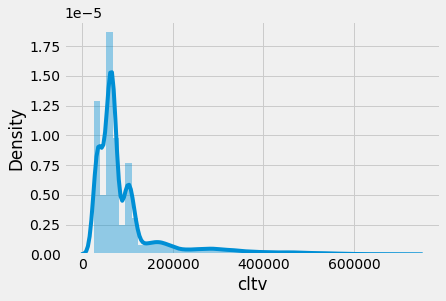

In [ ]:
sns.distplot(df['cltv'])

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 89392 entries, 0 to 89391
Data columns (total 12 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   id              89392 non-null  int64 
 1   gender          89392 non-null  object
 2   area            89392 non-null  object
 3   qualification   89392 non-null  object
 4   income          89392 non-null  object
 5   marital_status  89392 non-null  int64 
 6   vintage         89392 non-null  int64 
 7   claim_amount    89392 non-null  int64 
 8   num_policies    89392 non-null  object
 9   policy          89392 non-null  object
 10  type_of_policy  89392 non-null  object
 11  cltv            89392 non-null  int64 
dtypes: int64(5), object(7)
memory usage: 8.2+ MB


In [ ]:
df.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
id,89392.0,NaN,NaN,NaN,44696.5,25805.391969,1.0,22348.75,44696.5,67044.25,89392.0
gender,89392,2,Male,50497,NaN,NaN,NaN,NaN,NaN,NaN,NaN
area,89392,2,Urban,62455,NaN,NaN,NaN,NaN,NaN,NaN,NaN
qualification,89392,3,High School,46247,NaN,NaN,NaN,NaN,NaN,NaN,NaN
income,89392,4,5L-10L,52716,NaN,NaN,NaN,NaN,NaN,NaN,NaN
marital_status,89392.0,NaN,NaN,NaN,0.575488,0.494272,0.0,0.0,1.0,1.0,1.0
vintage,89392.0,NaN,NaN,NaN,4.595669,2.290446,0.0,3.0,5.0,6.0,8.0
claim_amount,89392.0,NaN,NaN,NaN,4351.502416,3262.359775,0.0,2406.0,4089.0,6094.0,31894.0
num_policies,89392,2,More than 1,60263,NaN,NaN,NaN,NaN,NaN,NaN,NaN
policy,89392,3,A,56644,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
df.isna().sum()

id                0
gender            0
area              0
qualification     0
income            0
marital_status    0
vintage           0
claim_amount      0
num_policies      0
policy            0
type_of_policy    0
cltv              0
dtype: int64

In [ ]:
df.duplicated().any()

False

<h2>Numerical Features

In [5]:
df.drop('id', axis=1, inplace=True)

In [6]:
num_features=[col for col in df.columns if df[col].dtype!='O']
num_features

['marital_status', 'vintage', 'claim_amount', 'cltv']

In [7]:
num=df[num_features]
num.head()

,marital_status,vintage,claim_amount,cltv
0,1,5,5790,64308
1,0,8,5080,515400
2,1,8,2599,64212
3,0,7,0,97920
4,1,6,3508,59736


In [ ]:
num['marital_status'].value_counts()

1    51444
0    37948
Name: marital_status, dtype: int64

In [8]:
num['marital_status'] = num['marital_status'].astype('object')

(array([0, 1]), <a list of 2 Text major ticklabel objects>)

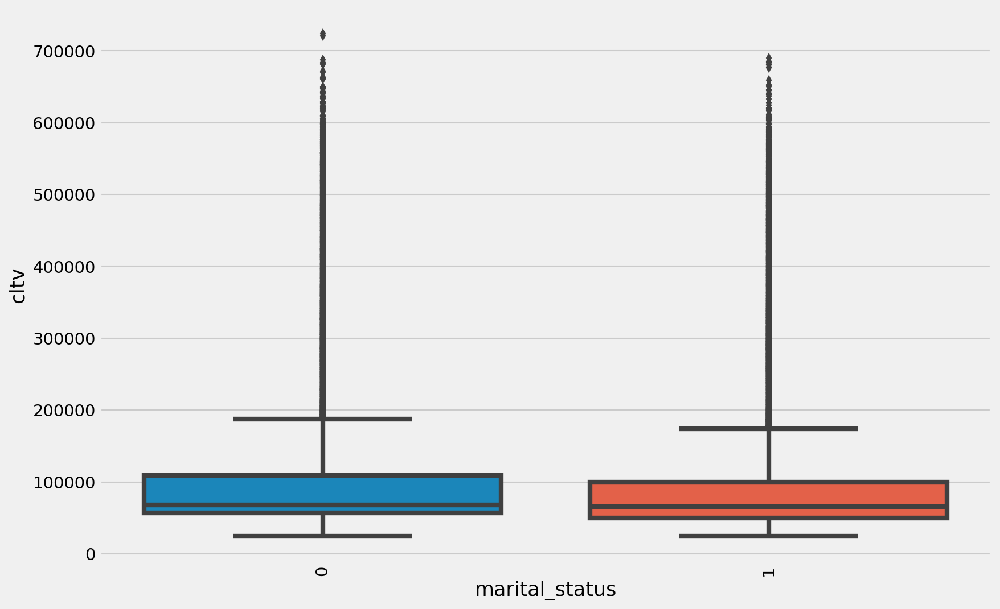

In [ ]:
plt.figure(figsize=(12,8), dpi=150)
sns.boxplot(y='cltv', x='marital_status', data=df.sort_values('cltv',ascending=False))
plt.xticks(rotation=90)

In [9]:
dict={1:'Married', 0:'Single'}
num['marital_status'] = num['marital_status'].map(dict)
num['marital_status'].head()

0    Married
1     Single
2    Married
3     Single
4    Married
Name: marital_status, dtype: object

In [10]:
marital_status=pd.get_dummies(num['marital_status'], drop_first=True)
marital_status.head()

,Single
0,0
1,1
2,0
3,1
4,0


In [ ]:
num['vintage'].value_counts()

6    17769
7    13095
5    12481
4    10471
2     9165
1     7671
8     7624
3     7085
0     4031
Name: vintage, dtype: int64

In [11]:
def map_vintage(vintage):
  if vintage == 0:
    return 'new'
  elif vintage <= 3:
    return '<=3'
  elif vintage <= 6:
    return '<=6'
  else:
    return '>6'

In [12]:
num['vintage'] = num['vintage'].map(map_vintage)

In [ ]:
num['vintage'].value_counts()

<=6    40721
<=3    23921
>6     20719
new     4031
Name: vintage, dtype: int64

(array([0, 1, 2, 3, 4, 5, 6, 7, 8]),
 <a list of 9 Text major ticklabel objects>)

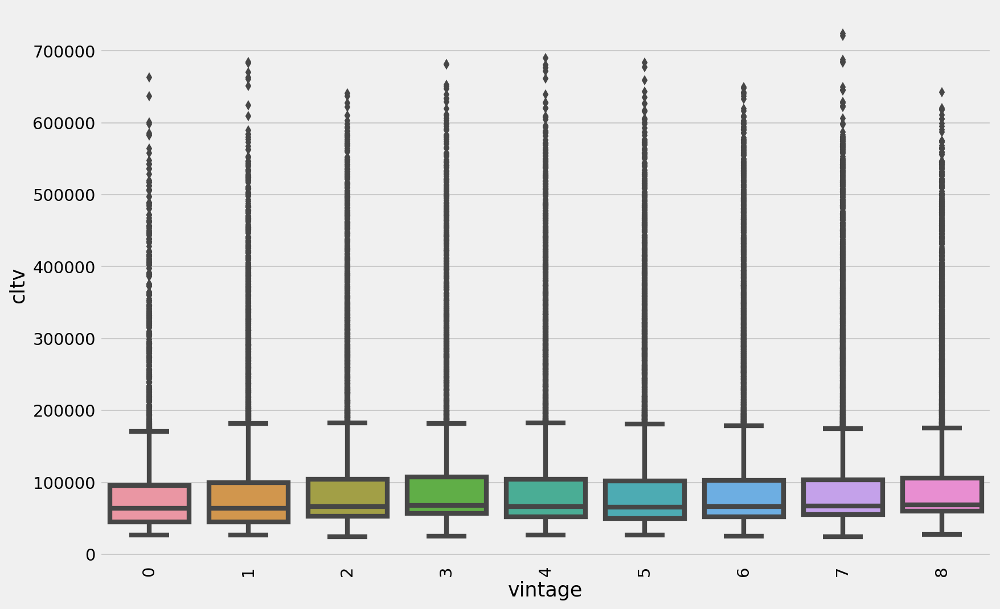

In [ ]:
plt.figure(figsize=(12,8), dpi=150)
sns.boxplot(y='cltv', x='vintage', data=df.sort_values('cltv',ascending=False))
plt.xticks(rotation=90)

In [13]:
vintage=pd.get_dummies(num['vintage'], drop_first=True)
vintage.head()

,<=6,>6,new
0,1,0,0
1,0,1,0
2,0,1,0
3,0,1,0
4,1,0,0


In [ ]:
num['claim_amount'].value_counts()

0        17671
4006        38
3912        33
3834        32
3833        32
         ...  
10979        1
12593        1
23063        1
21695        1
17143        1
Name: claim_amount, Length: 10889, dtype: int64

In [ ]:
num['claim_amount'].describe()

count    89392.000000
mean      4351.502416
std       3262.359775
min          0.000000
25%       2406.000000
50%       4089.000000
75%       6094.000000
max      31894.000000
Name: claim_amount, dtype: float64

In [14]:
def map_claim(claim_amount):
  if claim_amount <= 2406:
    return '<= 2406'
  elif claim_amount <= 4089:
    return '<=4089'
  elif claim_amount <= 6094:
    return '<=6094'
  else:
    return '>6094'

In [15]:
num['claim_amount'] = num['claim_amount'].map(map_claim)

In [16]:
claim_amount=pd.get_dummies(num['claim_amount'], drop_first=True)
claim_amount.head()

,<=4089,<=6094,>6094
0,0,1,0
1,0,1,0
2,1,0,0
3,0,0,0
4,1,0,0


<h2>Categorical Features

In [17]:
cat_features=[col for col in df.columns if df[col].dtype=='O']
cat_features

['gender',
 'area',
 'qualification',
 'income',
 'num_policies',
 'policy',
 'type_of_policy']

In [18]:
categorical=df[cat_features]
categorical.head()

,gender,area,qualification,income,num_policies,policy,type_of_policy
0,Male,Urban,Bachelor,5L-10L,More than 1,A,Platinum
1,Male,Rural,High School,5L-10L,More than 1,A,Platinum
2,Male,Urban,Bachelor,5L-10L,More than 1,A,Platinum
3,Female,Rural,High School,5L-10L,More than 1,A,Platinum
4,Male,Urban,High School,More than 10L,More than 1,A,Gold


In [ ]:
categorical['gender'].value_counts()

Male      50497
Female    38895
Name: gender, dtype: int64

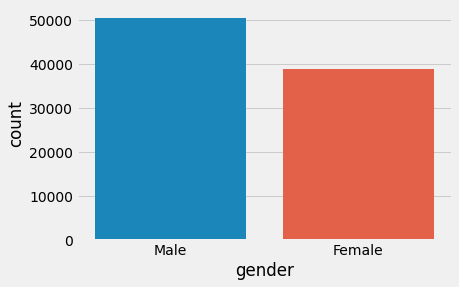

In [ ]:
sns.countplot(categorical['gender'])

(array([0, 1]), <a list of 2 Text major ticklabel objects>)

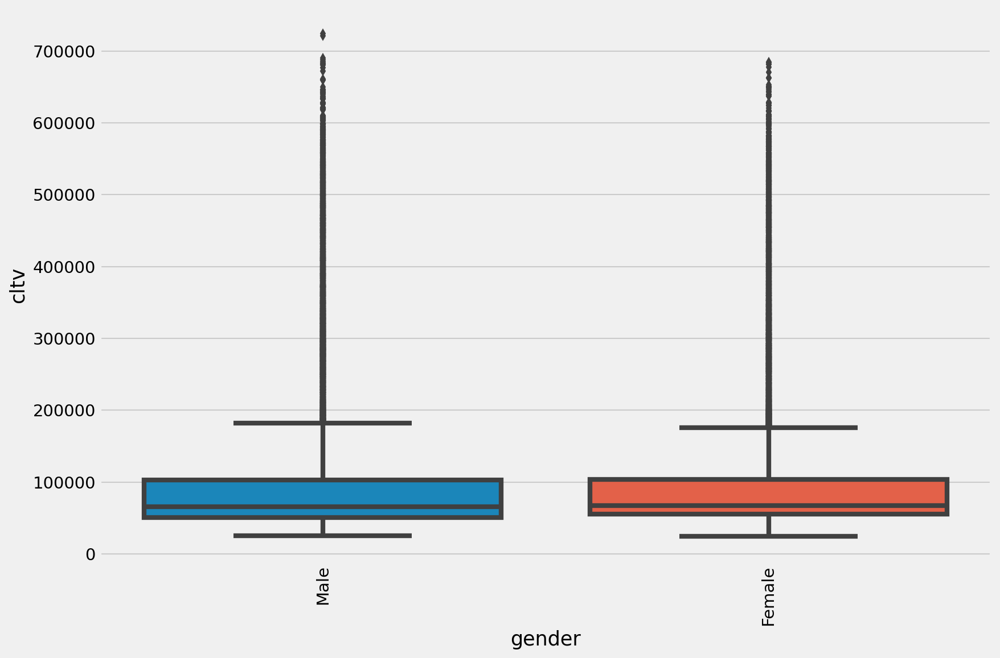

In [ ]:
plt.figure(figsize=(12,8), dpi=150)
sns.boxplot(y='cltv', x='gender', data=df.sort_values('cltv',ascending=False))
plt.xticks(rotation=90)

In [19]:
gender=pd.get_dummies(categorical['gender'], drop_first=True)
gender.head()

,Male
0,1
1,1
2,1
3,0
4,1


In [ ]:
categorical['area'].value_counts()

Urban    62455
Rural    26937
Name: area, dtype: int64

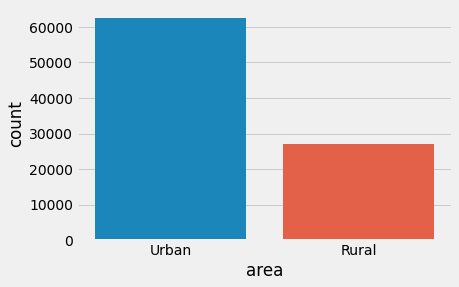

In [ ]:
sns.countplot(categorical['area'])

(array([0, 1]), <a list of 2 Text major ticklabel objects>)

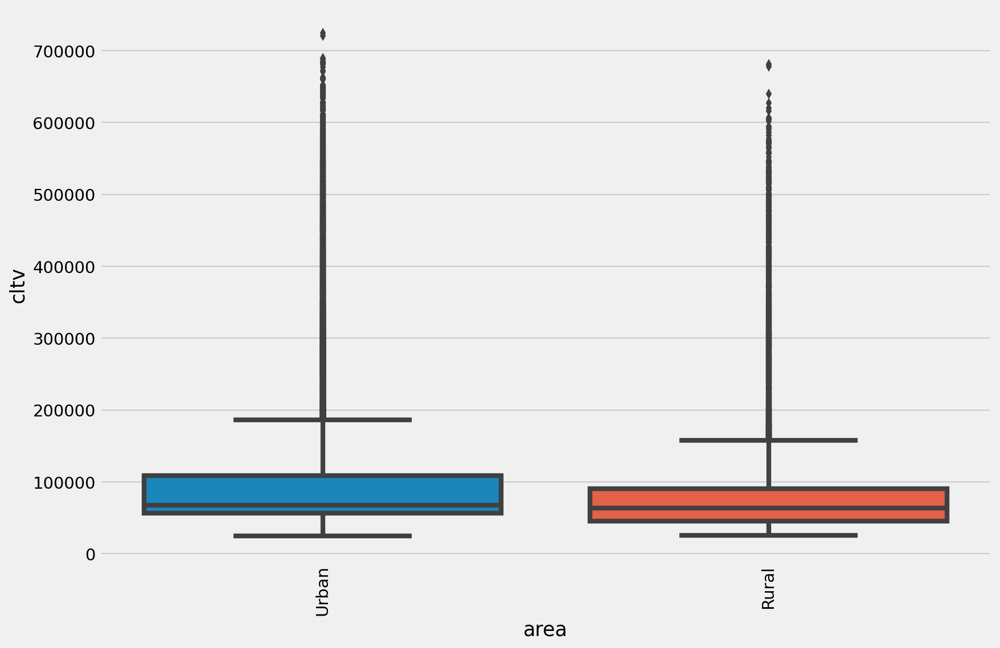

In [ ]:
plt.figure(figsize=(12,8), dpi=150)
sns.boxplot(y='cltv', x='area', data=df.sort_values('cltv',ascending=False))
plt.xticks(rotation=90)

In [20]:
area=pd.get_dummies(categorical['area'], drop_first=True)
area.head()

,Urban
0,1
1,0
2,1
3,0
4,1


In [ ]:
categorical['qualification'].value_counts()

High School    46247
Bachelor       39399
Others          3746
Name: qualification, dtype: int64

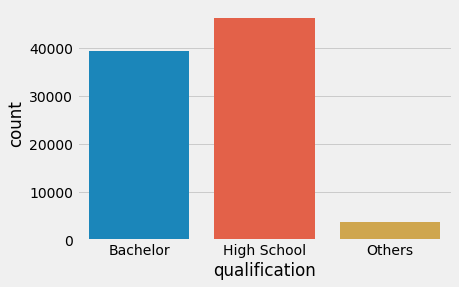

In [ ]:
sns.countplot(categorical['qualification'])

(array([0, 1, 2]), <a list of 3 Text major ticklabel objects>)

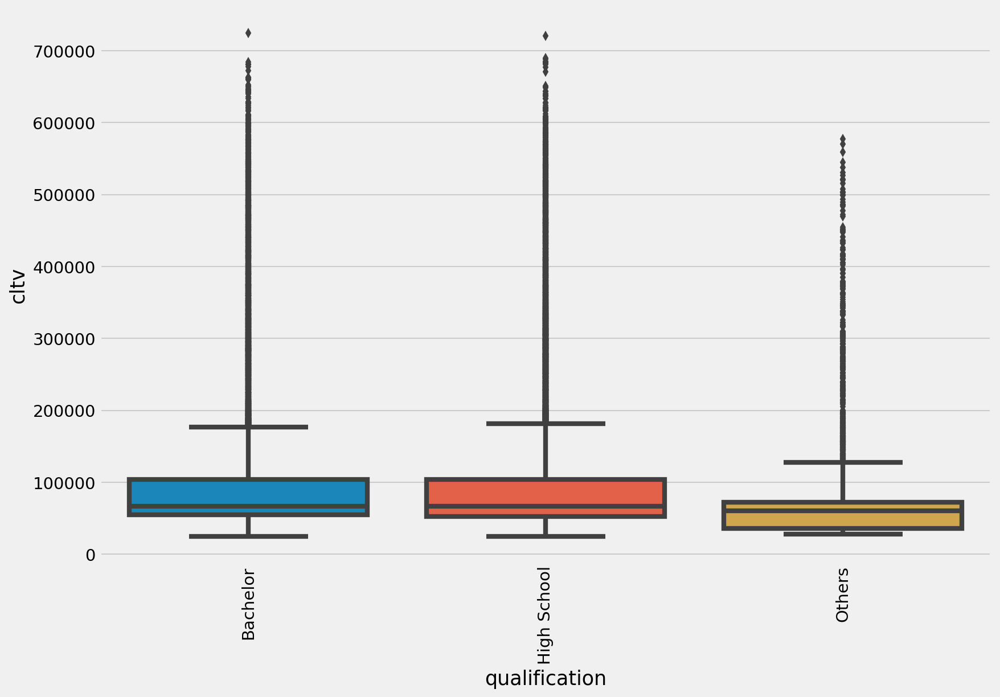

In [ ]:
plt.figure(figsize=(12,8), dpi=150)
sns.boxplot(y='cltv', x='qualification', data=df.sort_values('cltv',ascending=False))
plt.xticks(rotation=90)

In [21]:
qualification=pd.get_dummies(categorical['qualification'], drop_first=True)
qualification.head()

,High School,Others
0,0,0
1,1,0
2,0,0
3,1,0
4,1,0


In [ ]:
categorical['income'].value_counts()

5L-10L           52716
2L-5L            21158
More than 10L    13664
<=2L              1854
Name: income, dtype: int64

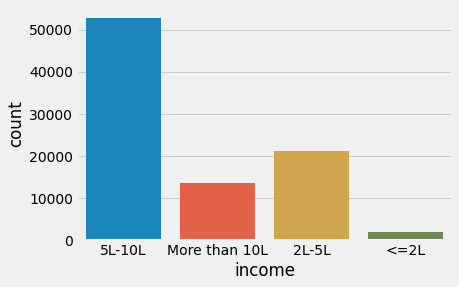

In [ ]:
sns.countplot(categorical['income'])

(array([0, 1, 2, 3]), <a list of 4 Text major ticklabel objects>)

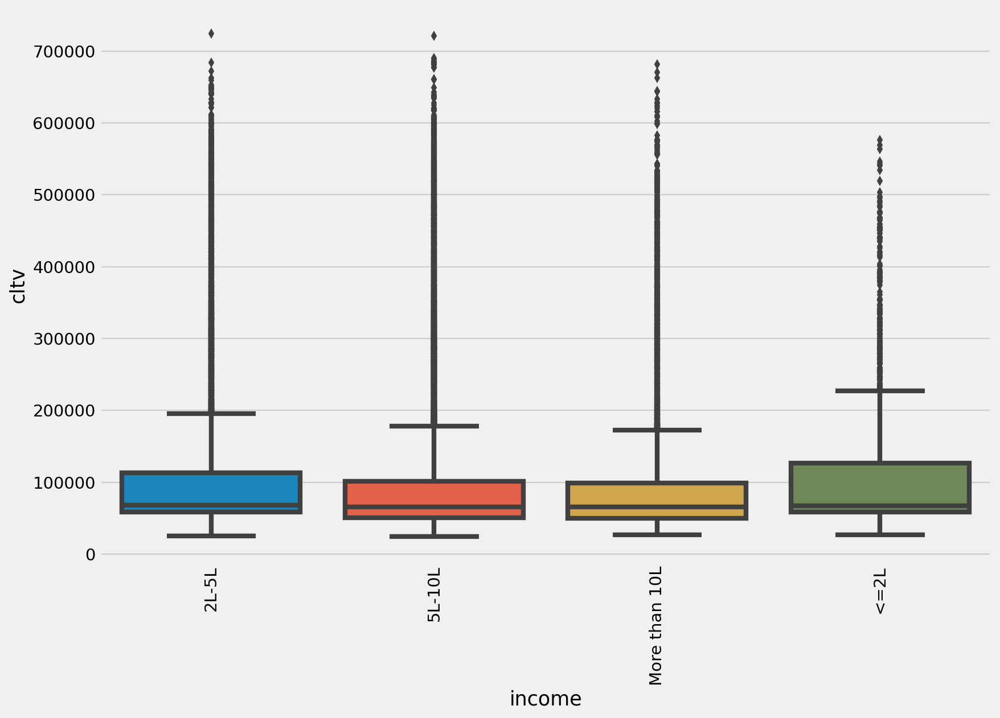

In [ ]:
plt.figure(figsize=(12,8), dpi=150)
sns.boxplot(y='cltv', x='income', data=df.sort_values('cltv',ascending=False))
plt.xticks(rotation=90)

In [22]:
dict={'<=2L':1, '2L-5L':2, '5L-10L':3, 'More than 10L':4}
income = pd.DataFrame(categorical['income'].map(dict), columns=['income'])
income.head()

,income
0,3
1,3
2,3
3,3
4,4


In [ ]:
categorical['num_policies'].value_counts()

More than 1    60263
1              29129
Name: num_policies, dtype: int64

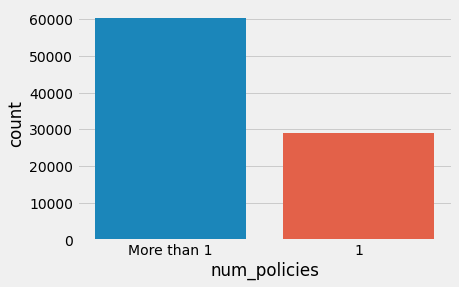

In [ ]:
sns.countplot(categorical['num_policies'])

(array([0, 1]), <a list of 2 Text major ticklabel objects>)

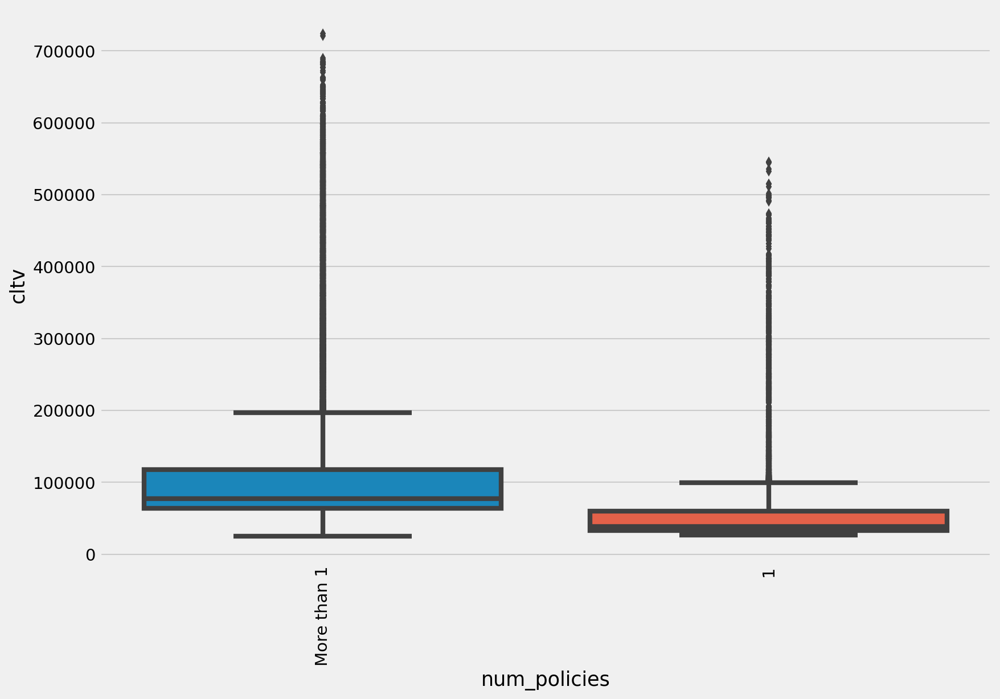

In [ ]:
plt.figure(figsize=(12,8), dpi=150)
sns.boxplot(y='cltv', x='num_policies', data=df.sort_values('cltv',ascending=False))
plt.xticks(rotation=90)

In [23]:
num_policies=pd.get_dummies(categorical['num_policies'], drop_first=True)
num_policies.head()

,More than 1
0,1
1,1
2,1
3,1
4,1


In [ ]:
categorical['policy'].value_counts()

A    56644
B    24635
C     8113
Name: policy, dtype: int64

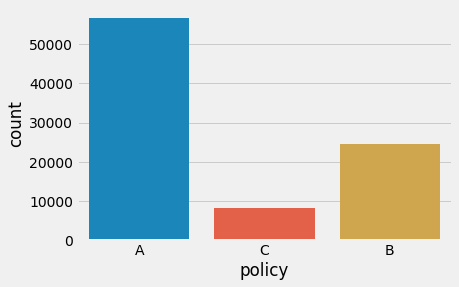

In [ ]:
sns.countplot(categorical['policy'])

(array([0, 1, 2]), <a list of 3 Text major ticklabel objects>)

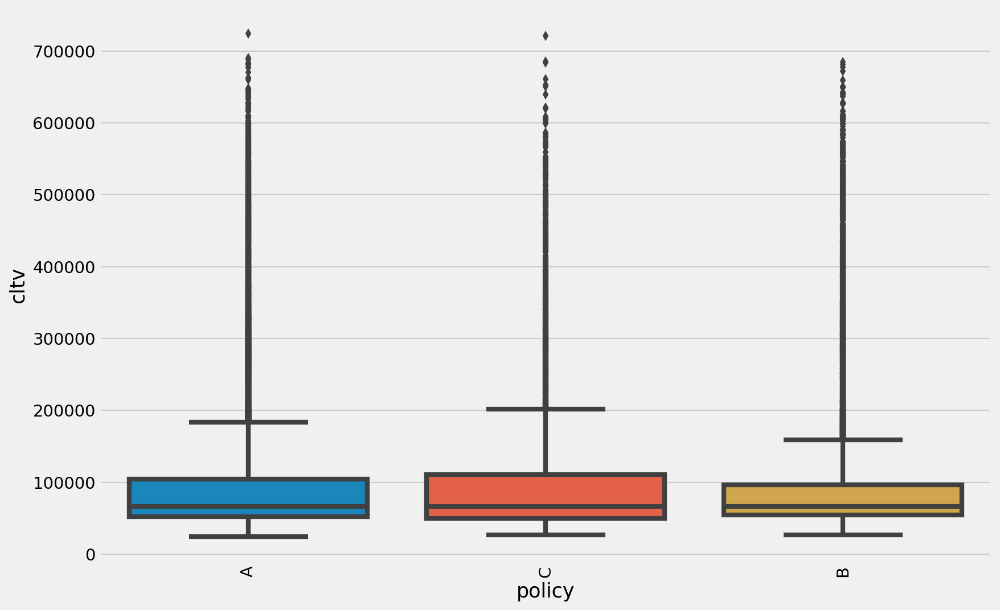

In [ ]:
plt.figure(figsize=(12,8), dpi=150)
sns.boxplot(y='cltv', x='policy', data=df.sort_values('cltv',ascending=False))
plt.xticks(rotation=90)

In [24]:
policy=pd.get_dummies(categorical['policy'], drop_first=True)
policy.head()

,B,C
0,0,0
1,0,0
2,0,0
3,0,0
4,0,0


In [ ]:
categorical['type_of_policy'].value_counts()

Platinum    47796
Silver      21010
Gold        20586
Name: type_of_policy, dtype: int64

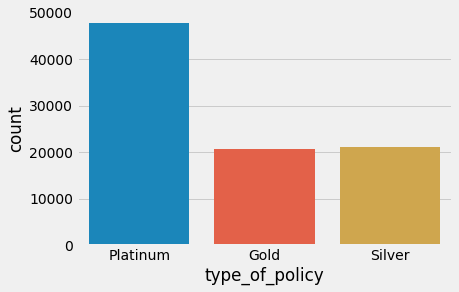

In [ ]:
sns.countplot(categorical['type_of_policy'])

(array([0, 1, 2]), <a list of 3 Text major ticklabel objects>)

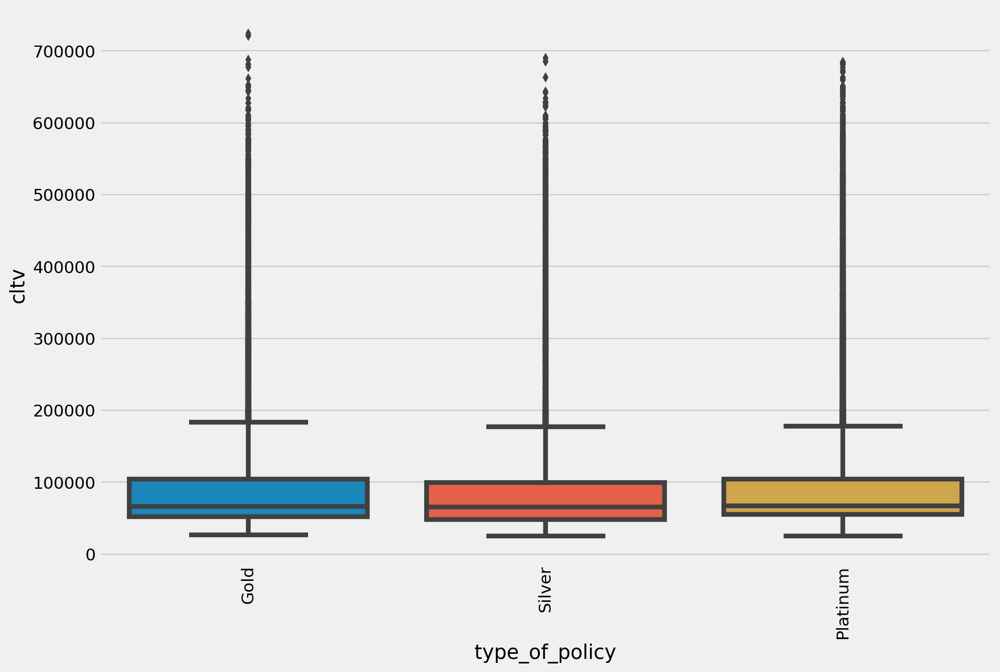

In [ ]:
plt.figure(figsize=(12,8), dpi=150)
sns.boxplot(y='cltv', x='type_of_policy', data=df.sort_values('cltv',ascending=False))
plt.xticks(rotation=90)

In [25]:
dict={'Silver':1, 'Gold':2, 'Platinum':3}
type_of_policy = pd.DataFrame(categorical['type_of_policy'].map(dict), columns=['type_of_policy'])
type_of_policy.head()

,type_of_policy
0,3
1,3
2,3
3,3
4,2


In [26]:
df.columns

Index(['gender', 'area', 'qualification', 'income', 'marital_status',
       'vintage', 'claim_amount', 'num_policies', 'policy', 'type_of_policy',
       'cltv'],
      dtype='object')

In [27]:
data = pd.concat([gender,area,qualification,income,marital_status,vintage,claim_amount,num_policies,policy,type_of_policy,df['cltv']],axis=1)
data.head()

,Male,Urban,High School,Others,income,Single,<=6,>6,new,<=4089,<=6094,>6094,More than 1,B,C,type_of_policy,cltv
0,1,1,0,0,3,0,1,0,0,0,1,0,1,0,0,3,64308
1,1,0,1,0,3,1,0,1,0,0,1,0,1,0,0,3,515400
2,1,1,0,0,3,0,0,1,0,1,0,0,1,0,0,3,64212
3,0,0,1,0,3,1,0,1,0,0,0,0,1,0,0,3,97920
4,1,1,1,0,4,0,1,0,0,1,0,0,1,0,0,2,59736


In [ ]:
data = pd.concat([gender,area,qualification,income,marital_status,df['vintage'],df['claim_amount'],num_policies,policy,type_of_policy,df['cltv']],axis=1)
data.head()

,Male,Urban,High School,Others,income,Single,vintage,claim_amount,More than 1,B,C,type_of_policy,cltv
0,1,1,0,0,3,0,5,5790,1,0,0,3,64308
1,1,0,1,0,3,1,8,5080,1,0,0,3,515400
2,1,1,0,0,3,0,8,2599,1,0,0,3,64212
3,0,0,1,0,3,1,7,0,1,0,0,3,97920
4,1,1,1,0,4,0,6,3508,1,0,0,2,59736


<h2>Building model

In [28]:
X=data.drop('cltv',axis=1)
X.head()

,Male,Urban,High School,Others,income,Single,<=6,>6,new,<=4089,<=6094,>6094,More than 1,B,C,type_of_policy
0,1,1,0,0,3,0,1,0,0,0,1,0,1,0,0,3
1,1,0,1,0,3,1,0,1,0,0,1,0,1,0,0,3
2,1,1,0,0,3,0,0,1,0,1,0,0,1,0,0,3
3,0,0,1,0,3,1,0,1,0,0,0,0,1,0,0,3
4,1,1,1,0,4,0,1,0,0,1,0,0,1,0,0,2


In [29]:
y=data['cltv']

In [30]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.15, random_state=101, shuffle =True)

In [31]:
print('X_train shape is ' , X_train.shape)
print('X_test shape is ' , X_test.shape)
print('y_train shape is ' , y_train.shape)
print('y_test shape is ' , y_test.shape)

X_train shape is  (75983, 16)
X_test shape is  (13409, 16)
y_train shape is  (75983,)
y_test shape is  (13409,)


In [32]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.model_selection import GridSearchCV

In [33]:
def predict(ml_model):          
    model=ml_model.fit(X_train,y_train)
    print('Training score : {}'.format(model.score(X_train,y_train)))
    y_prediction=model.predict(X_test)
    print('predictions are: \n {}'.format(y_prediction))
    print('\n')
    r2=r2_score(y_test,y_prediction)
    print('r2 score: {}'.format(r2))
    print('MAE:', mean_absolute_error(y_test,y_prediction))
    print('MSE:', mean_squared_error(y_test,y_prediction))
    print('RMSE:', np.sqrt(mean_squared_error(y_test,y_prediction)))
    sns.distplot(y_test-y_prediction)

In [ ]:
random_forest_model = RandomForestRegressor()

In [ ]:
max_depth=[3, 4, 5]
min_samples_split= [5,10,15,200]
min_samples_leaf= [5,10, 15, 200]

In [ ]:
param_grid={
    'max_depth':max_depth,
    'min_samples_split': min_samples_split,
    'min_samples_leaf': min_samples_leaf
    }

In [ ]:
rf_model=GridSearchCV(estimator=random_forest_model, param_grid=param_grid, scoring='neg_mean_squared_error', cv=5, verbose=2, n_jobs= -1)

In [ ]:
rf_model.fit(X_train, y_train)

Fitting 5 folds for each of 48 candidates, totalling 240 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  7.0min
[Parallel(n_jobs=-1)]: Done 240 out of 240 | elapsed: 11.7min finished


GridSearchCV(cv=5, error_score=nan,
             estimator=RandomForestRegressor(bootstrap=True, ccp_alpha=0.0,
                                             criterion='mse', max_depth=None,
                                             max_features='auto',
                                             max_leaf_nodes=None,
                                             max_samples=None,
                                             min_impurity_decrease=0.0,
                                             min_impurity_split=None,
                                             min_samples_leaf=1,
                                             min_samples_split=2,
                                             min_weight_fraction_leaf=0.0,
                                             n_estimators=100, n_jobs=None,
                                             oob_score=False, random_state=None,
                                             verbose=0, warm_start=False),
             iid='deprecated', n_jo

In [ ]:
random_forest_model = rf_model.best_estimator_

Training score : 0.15725969532455542
predictions are: 
 [ 89878.06493729  49480.69499128 129304.22156734 ...  54791.19285744
  60471.89389532  49132.43419156]


r2 score: 0.1587851958978086
MAE: 50186.075484877285
MSE: 6776592164.893908
RMSE: 82320.05931055873


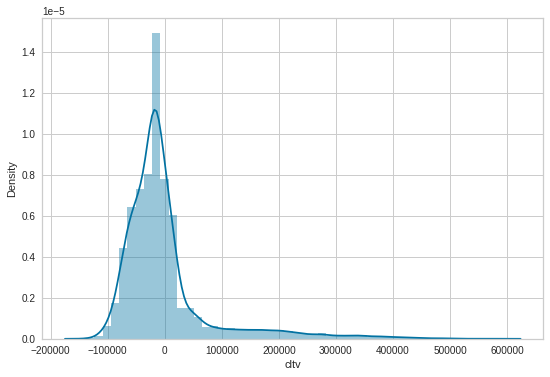

In [ ]:
predict(random_forest_model)

In [ ]:
gradient_model = GradientBoostingRegressor(learning_rate=0.1,)

In [ ]:
ada_model = AdaBoostRegressor(learning_rate=0.1,)

In [ ]:
param_grid={
    'n_estimators': [100, 200, 500]
    }

In [ ]:
grad_model=GridSearchCV(estimator=gradient_model, param_grid=param_grid, scoring='neg_mean_squared_error', cv=5, verbose=2, n_jobs= -1)

In [ ]:
adaboost_model=GridSearchCV(estimator=ada_model, param_grid=param_grid, scoring='neg_mean_squared_error', cv=5, verbose=2, n_jobs= -1)

In [ ]:
grad_model.fit(X_train, y_train)

Fitting 5 folds for each of 3 candidates, totalling 15 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  15 out of  15 | elapsed:  2.2min finished


GridSearchCV(cv=5, error_score=nan,
             estimator=GradientBoostingRegressor(alpha=0.9, ccp_alpha=0.0,
                                                 criterion='friedman_mse',
                                                 init=None, learning_rate=0.1,
                                                 loss='ls', max_depth=3,
                                                 max_features=None,
                                                 max_leaf_nodes=None,
                                                 min_impurity_decrease=0.0,
                                                 min_impurity_split=None,
                                                 min_samples_leaf=1,
                                                 min_samples_split=2,
                                                 min_weight_fraction_leaf=0.0,
                                                 n_estimators=100,
                                                 n_iter_no_change=None,
                 

In [ ]:
adaboost_model.fit(X_train, y_train)

Fitting 5 folds for each of 3 candidates, totalling 15 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  15 out of  15 | elapsed:  1.7min finished


GridSearchCV(cv=5, error_score=nan,
             estimator=AdaBoostRegressor(base_estimator=None, learning_rate=0.1,
                                         loss='linear', n_estimators=50,
                                         random_state=None),
             iid='deprecated', n_jobs=-1,
             param_grid={'n_estimators': [100, 200, 500]},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring='neg_mean_squared_error', verbose=2)

In [ ]:
grad_model = grad_model.best_estimator_

In [ ]:
ada_model = adaboost_model.best_estimator_

Training score : 0.16203112361734517
predictions are: 
 [ 79934.84362736  48275.24982402 136258.44608081 ...  48498.95176185
  60153.6730449   46921.11923505]


r2 score: 0.1607634827120784
MAE: 50137.193577271624
MSE: 6760655637.314841
RMSE: 82223.20619700282


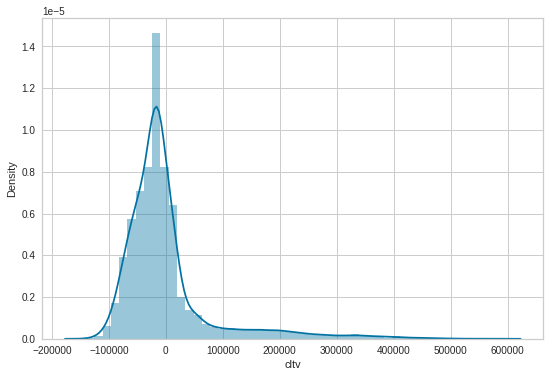

In [ ]:
predict(grad_model)

In [ ]:
!pip install catboost

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 76.6/76.6 MB 7.6 MB/s eta 0:00:00


In [ ]:
import catboost as cb

In [ ]:
train_dataset = cb.Pool(X_train, y_train) 
test_dataset = cb.Pool(X_test, y_test)

In [ ]:
model = cb.CatBoostRegressor(loss_function='RMSE')

In [ ]:
grid = {'iterations': [100, 150, 200],
        'learning_rate': [0.03, 0.1],
        'depth': [2, 4, 6, 8],
        'l2_leaf_reg': [0.2, 0.5, 1, 3]}
model.grid_search(grid, train_dataset)

Streaming output truncated to the last 5000 lines.
61:	learn: 82668.0780465	test: 84381.0951565	best: 84379.3622268 (52)	total: 701ms	remaining: 1.56s
62:	learn: 82656.9799089	test: 84380.9747667	best: 84379.3622268 (52)	total: 713ms	remaining: 1.55s
63:	learn: 82649.1927172	test: 84383.6383799	best: 84379.3622268 (52)	total: 723ms	remaining: 1.54s
64:	learn: 82645.1703558	test: 84382.1419502	best: 84379.3622268 (52)	total: 733ms	remaining: 1.52s
65:	learn: 82640.4950623	test: 84385.1576054	best: 84379.3622268 (52)	total: 745ms	remaining: 1.51s
66:	learn: 82634.8685994	test: 84389.0271733	best: 84379.3622268 (52)	total: 756ms	remaining: 1.5s
67:	learn: 82629.6635994	test: 84389.9316335	best: 84379.3622268 (52)	total: 766ms	remaining: 1.49s
68:	learn: 82623.7432834	test: 84386.4269746	best: 84379.3622268 (52)	total: 776ms	remaining: 1.47s
69:	learn: 82618.8822732	test: 84388.1859598	best: 84379.3622268 (52)	total: 787ms	remaining: 1.46s
70:	learn: 82613.9677593	test: 84388.4793238	best:

{'params': {'depth': 4,
  'iterations': 100,
  'learning_rate': 0.1,
  'l2_leaf_reg': 0.2},
 'cv_results': defaultdict(list,
             {'iterations': [0,
               1,
               2,
               3,
               4,
               5,
               6,
               7,
               8,
               9,
               10,
               11,
               12,
               13,
               14,
               15,
               16,
               17,
               18,
               19,
               20,
               21,
               22,
               23,
               24,
               25,
               26,
               27,
               28,
               29,
               30,
               31,
               32,
               33,
               34,
               35,
               36,
               37,
               38,
               39,
               40,
               41,
               42,
               43,
               44,
               4

In [ ]:
pred = model.predict(X_test)
rmse = (np.sqrt(mean_squared_error(y_test, pred)))
r2 = r2_score(y_test, pred)
print("Testing performance")
print('RMSE: {:.2f}'.format(rmse))
print('R2: {:.2f}'.format(r2))

Testing performance
RMSE: 82166.00
R2: 0.16


In [163]:
data_test.head()

,id,gender,area,qualification,income,marital_status,vintage,claim_amount,num_policies,policy,type_of_policy
0,89393,Female,Rural,High School,5L-10L,Single,<=6,<= 2406,More than 1,B,Silver
1,89394,Female,Urban,High School,2L-5L,Single,<=6,<=6094,More than 1,A,Platinum
2,89395,Male,Rural,High School,5L-10L,Married,>6,<=4089,More than 1,B,Gold
3,89396,Female,Rural,Bachelor,More than 10L,Married,<=3,<= 2406,More than 1,B,Silver
4,89397,Female,Urban,High School,2L-5L,Single,<=6,>6094,More than 1,B,Silver


In [37]:
data_test['marital_status'] = data_test['marital_status'].astype('object')
dict={1:'Married', 0:'Single'}
data_test['marital_status'] = data_test['marital_status'].map(dict)
marital_status=pd.get_dummies(data_test['marital_status'])
data_test['vintage'] = data_test['vintage'].map(map_vintage)
vintage=pd.get_dummies(data_test['vintage'])
data_test['claim_amount'] = data_test['claim_amount'].map(map_claim)
claim_amount=pd.get_dummies(data_test['claim_amount'])
gender=pd.get_dummies(data_test['gender'])
area=pd.get_dummies(data_test['area'])
qualification=pd.get_dummies(data_test['qualification'])
dict={'<=2L':1, '2L-5L':2, '5L-10L':3, 'More than 10L':4}
income = pd.DataFrame(data_test['income'].map(dict), columns=['income'])
num_policies=pd.get_dummies(data_test['num_policies'])
policy=pd.get_dummies(data_test['policy'])
dict={'Silver':1, 'Gold':2, 'Platinum':3}
type_of_policy = pd.DataFrame(data_test['type_of_policy'].map(dict), columns=['type_of_policy'])
test_data = pd.concat([gender,area,qualification,income,marital_status,vintage,claim_amount,num_policies,policy,type_of_policy],axis=1)

In [38]:
test_data.head()

,Female,Male,Rural,Urban,Bachelor,High School,Others,income,Married,Single,<=3,<=6,>6,new,<= 2406,<=4089,<=6094,>6094,1,More than 1,A,B,C,type_of_policy
0,1,0,1,0,0,1,0,3,0,1,0,1,0,0,1,0,0,0,0,1,0,1,0,1
1,1,0,0,1,0,1,0,2,0,1,0,1,0,0,0,0,1,0,0,1,1,0,0,3
2,0,1,1,0,0,1,0,3,1,0,0,0,1,0,0,1,0,0,0,1,0,1,0,2
3,1,0,1,0,1,0,0,4,1,0,1,0,0,0,1,0,0,0,0,1,0,1,0,1
4,1,0,0,1,0,1,0,2,0,1,0,1,0,0,0,0,0,1,0,1,0,1,0,1


In [40]:
test_data = test_data[X.columns]

In [41]:
test_data.columns

Index(['Male', 'Urban', 'High School', 'Others', 'income', 'Single', '<=6',
       '>6', 'new', '<=4089', '<=6094', '>6094', 'More than 1', 'B', 'C',
       'type_of_policy'],
      dtype='object')

In [42]:
X.columns

Index(['Male', 'Urban', 'High School', 'Others', 'income', 'Single', '<=6',
       '>6', 'new', '<=4089', '<=6094', '>6094', 'More than 1', 'B', 'C',
       'type_of_policy'],
      dtype='object')

In [122]:
test_prediction=model.predict(test_data)

NameError: ignored

In [ ]:
data_test['cltv'] = pd.DataFrame(test_prediction, columns=['cltv'])

In [ ]:
submission = data_test[['id', 'cltv']]

In [ ]:
submission.to_csv("cat_boost_submission.csv",index=False)

Training score : -0.1370980408716571
predictions are: 
 [140238.05102435  63988.79887059 191895.73915994 ...  66892.66477217
  92274.92088608  63988.79887059]


r2 score: -0.1367001501623688
MAE: 75760.64869569168
MSE: 9156939813.541698
RMSE: 95691.90045945215


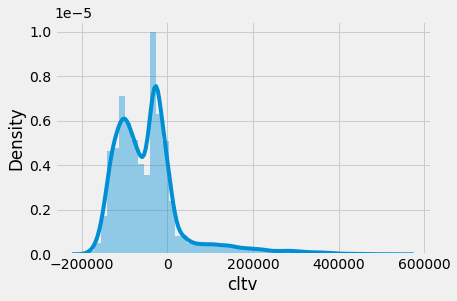

In [ ]:
predict(ada_model)

Training score : 0.15116785149748369
predictions are: 
 [ 95120.39800258  44612.61073825 128833.31392445 ...  56102.27609383
  62844.6489781   54686.04322931]


r2 score: 0.15580747854673416
MAE: 51015.67851566303
MSE: 6800579826.513933
RMSE: 82465.62815206061


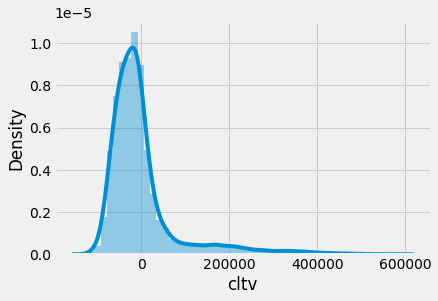

In [ ]:
predict(Lasso(alpha=.1))

Training score : 0.15116759716974126
predictions are: 
 [ 95096.2955271   44571.55301534 128859.66468597 ...  56104.06538407
  62900.61676578  54653.8645843 ]


r2 score: 0.15580882957792208
MAE: 51018.85289640356
MSE: 6800568942.982976
RMSE: 82465.56216374793


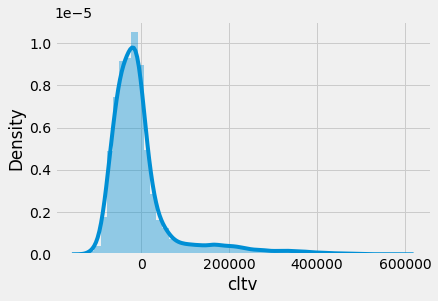

In [ ]:
predict(Ridge(solver='saga', alpha=.1))

Training score : 0.10524112977548838
predictions are: 
 [ 65064.   45972.  125680.8 ...  56148.   37735.2  52975.2]


r2 score: -0.018609567888094647
MAE: 55796.31274517115
MSE: 8205634973.582664
RMSE: 90584.95997450495


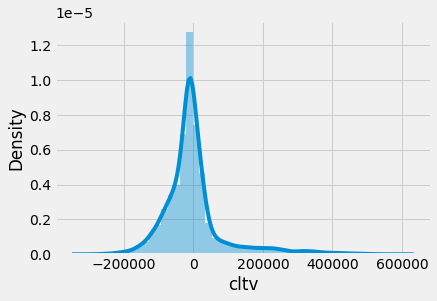

In [ ]:
knn_model = KNeighborsRegressor(n_neighbors=5, metric='minkowski', n_jobs=-1)
predict(knn_model)

In [ ]:
import xgboost as xgb

In [ ]:
xgb_model = xgb.XGBRegressor(n_estimators=500)

In [ ]:
predict(xgb_model)

ValueError: ignored

In [ ]:
from sklearn.svm import SVR

In [ ]:
svr_model = SVR()

Training score : -0.11528272701991149
predictions are: 
 [66107.85723686 64982.12658681 67025.61454871 ... 65134.87586412
 65268.90048443 65040.79072072]


r2 score: -0.1192276835453645
MAE: 48585.88720109157
MSE: 9016186488.944027
RMSE: 94953.60176920108


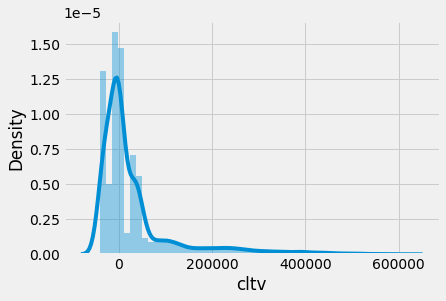

In [ ]:
predict(svr_model)

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Activation, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
import tensorflow as tf

In [ ]:
model = Sequential()

model.add(Dense(64,activation='relu'))
model.add(Dropout(0.3))
model.add(Dense(128,activation='relu'))
model.add(Dropout(0.3))
model.add(Dense(256,activation='relu'))
model.add(Dense(1))

model.compile(optimizer='adam',loss='mse', metrics=[tf.keras.metrics.MeanSquaredError()])

In [ ]:
early_stop = EarlyStopping(monitor='val_loss', patience=10, verbose=1)

In [ ]:
model.fit(X_train, y_train, validation_data=(X_test, y_test), batch_size=128, callbacks=[early_stop], validation_batch_size=128, epochs=50)

Epoch 1/50
594/594 [==============================] - 4s 5ms/step - loss: 10095456256.0000 - mean_squared_error: 10095456256.0000 - val_loss: 7361498112.0000 - val_mean_squared_error: 7361498112.0000
Epoch 2/50
594/594 [==============================] - 3s 5ms/step - loss: 7401446400.0000 - mean_squared_error: 7401446400.0000 - val_loss: 6959481344.0000 - val_mean_squared_error: 6959481344.0000
Epoch 3/50
594/594 [==============================] - 3s 5ms/step - loss: 7150845952.0000 - mean_squared_error: 7150845952.0000 - val_loss: 6804863488.0000 - val_mean_squared_error: 6804863488.0000
Epoch 4/50
594/594 [==============================] - 3s 5ms/step - loss: 7095617024.0000 - mean_squared_error: 7095617024.0000 - val_loss: 6789015040.0000 - val_mean_squared_error: 6789015040.0000
Epoch 5/50
594/594 [==============================] - 3s 5ms/step - loss: 7089684992.0000 - mean_squared_error: 7089684992.0000 - val_loss: 6771091968.0000 - val_mean_squared_error: 6771091968.0000
Epoch 6/

<h2>Quantile Transformer

In [ ]:
from sklearn.preprocessing import QuantileTransformer
from sklearn.compose import TransformedTargetRegressor

In [ ]:
qt = QuantileTransformer(output_distribution='normal')

In [ ]:
X_tf = qt.fit_transform(X)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X_tf, y, random_state=0, train_size=0.85)

In [ ]:
print('X_train shape is ' , X_train.shape)
print('X_test shape is ' , X_test.shape)
print('y_train shape is ' , y_train.shape)
print('y_test shape is ' , y_test.shape)

X_train shape is  (75983, 12)
X_test shape is  (13409, 12)
y_train shape is  (75983,)
y_test shape is  (13409,)


In [ ]:
regressor = LinearRegression()

In [ ]:
regr = TransformedTargetRegressor(regressor=regressor,transformer=qt)

Training score : 0.05700275290964685
predictions are: 
 [89354.90042164 93708.72617523 74128.03769479 ... 93649.97030232
 95586.77904746 94572.26912179]


r2 score: 0.05373394191486458
MAE: 45082.86762098645
MSE: 7845578567.540576
RMSE: 88575.27063204818


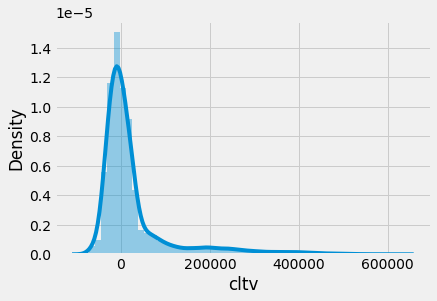

In [ ]:
predict(regr)

In [ ]:
regr = TransformedTargetRegressor(regressor=rf_model, transformer=qt)

Fitting 5 folds for each of 48 candidates, totalling 240 fits
Training score : 0.052325604281011295
predictions are: 
 [81901.85829027 92797.6446092  72670.78631999 ... 73790.42440148
 95506.61033562 93409.70170897]


r2 score: 0.04692819468955989
MAE: 44768.34837972752
MSE: 7902005641.206305
RMSE: 88893.22607041722


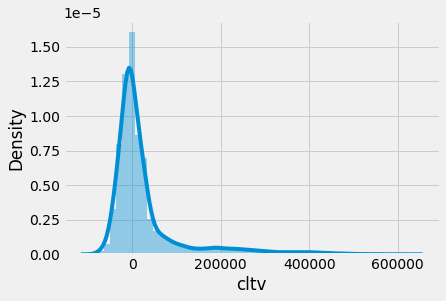

In [ ]:
predict(regr)

In [ ]:
regr = TransformedTargetRegressor(regressor=grad_model, transformer=qt)

Fitting 5 folds for each of 3 candidates, totalling 15 fits
Training score : 0.05437435819979741
predictions are: 
 [89636.63801654 92696.7607842  71984.20077761 ... 77799.53598322
 96655.83062683 94019.78856358]


r2 score: 0.04848452795562008
MAE: 44705.96223259044
MSE: 7889101939.534007
RMSE: 88820.61663563256


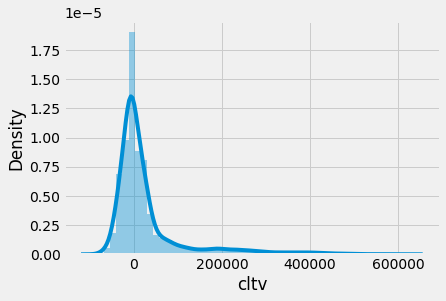

In [ ]:
predict(regr)

In [ ]:
regr = TransformedTargetRegressor(regressor=adaboost_model, transformer=qt)

Fitting 5 folds for each of 3 candidates, totalling 15 fits
Training score : 0.04552532613911853
predictions are: 
 [93331.98105849 92639.98307038 76729.41309377 ... 77547.32846484
 93958.17911686 88298.32520965]


r2 score: 0.03967365990532612
MAE: 45201.59330954927
MSE: 7962153653.6329975
RMSE: 89230.90077788635


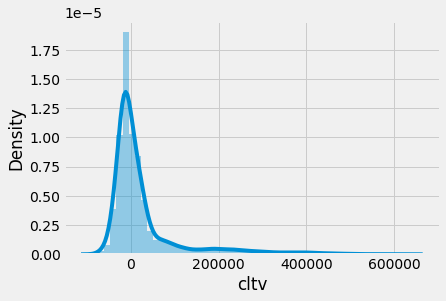

In [ ]:
predict(regr)

In [ ]:
regr = TransformedTargetRegressor(regressor=xgb_model, transformer=qt)

[08:12:41] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Training score : 0.06757321623033552
predictions are: 
 [75161.01  79318.41  70122.91  ... 90775.58  97564.94  95204.125]


r2 score: 0.04924582509179576
MAE: 44725.86708175246
MSE: 7882789955.241559
RMSE: 88785.07732294634


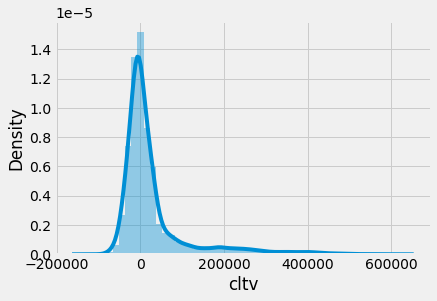

In [ ]:
predict(regr)

<h2> Pycaret

In [ ]:
!pip install pycaret

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
from pycaret.regression import *

In [ ]:
from pycaret.utils import enable_colab
enable_colab()

Colab mode enabled.


In [ ]:
df.drop('id', axis=1, inplace=True)

In [ ]:
data = df.sample(frac=0.85, random_state=101)
data_unseen = df.drop(data.index)

data.reset_index(drop=True, inplace=True)
data_unseen.reset_index(drop=True, inplace=True)

print('Data for Modeling: ' + str(data.shape))
print('Unseen Data For Predictions: ' + str(data_unseen.shape))

Data for Modeling: (75983, 11)
Unseen Data For Predictions: (13409, 11)


In [ ]:
model = setup(data = data, target = 'cltv', session_id=123)

,Description,Value
0,session_id,123
1,Target,cltv
2,Original Data,"(75983, 11)"
3,Missing Values,False
4,Numeric Features,1
5,Categorical Features,9
6,Ordinal Features,False
7,High Cardinality Features,False
8,High Cardinality Method,None
9,Transformed Train Set,"(53188, 27)"


INFO:logs:create_model_container: 0
INFO:logs:master_model_container: 0
INFO:logs:display_container: 1
INFO:logs:Pipeline(memory=None,
         steps=[('dtypes',
                 DataTypes_Auto_infer(categorical_features=[],
                                      display_types=True, features_todrop=[],
                                      id_columns=[], ml_usecase='regression',
                                      numerical_features=[], target='cltv',
                                      time_features=[])),
                ('imputer',
                 Simple_Imputer(categorical_strategy='not_available',
                                fill_value_categorical=None,
                                fill_value_numerical=None,
                                numeric_strategy='m...
                ('scaling', 'passthrough'), ('P_transform', 'passthrough'),
                ('binn', 'passthrough'), ('rem_outliers', 'passthrough'),
                ('cluster_all', 'passthrough'),
              

In [ ]:
best = compare_models(exclude = ['ransac'])

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
gbr,Gradient Boosting Regressor,50326.5548,6.830658e+09,82619.2415,0.1615,0.5640,0.5454,4.297
lightgbm,Light Gradient Boosting Machine,50370.3048,6.863278e+09,82816.4577,0.1575,0.5652,0.5455,0.410
lasso,Lasso Regression,51299.3474,6.889020e+09,82969.9631,0.1544,0.5817,0.5649,0.421
ridge,Ridge Regression,51299.6532,6.889028e+09,82970.0132,0.1544,0.5817,0.5649,0.026
lar,Least Angle Regression,51300.0642,6.889028e+09,82970.0190,0.1544,0.5817,0.5649,0.041
llar,Lasso Least Angle Regression,51231.7864,6.889060e+09,82970.0472,0.1544,0.5800,0.5636,0.041
lr,Linear Regression,51300.0625,6.889029e+09,82970.0212,0.1544,0.5817,0.5649,0.338
omp,Orthogonal Matching Pursuit,51215.1279,6.939829e+09,83273.0890,0.1483,0.5746,0.5572,0.036
en,Elastic Net,53260.5255,7.363498e+09,85779.0593,0.0962,0.6328,0.6510,0.153
rf,Random Forest Regressor,54865.9435,7.738193e+09,87943.3899,0.0498,0.6149,0.6120,21.208


INFO:logs:create_model_container: 18
INFO:logs:master_model_container: 18
INFO:logs:display_container: 2
INFO:logs:GradientBoostingRegressor(alpha=0.9, ccp_alpha=0.0, criterion='friedman_mse',
                          init=None, learning_rate=0.1, loss='ls', max_depth=3,
                          max_features=None, max_leaf_nodes=None,
                          min_impurity_decrease=0.0, min_impurity_split=None,
                          min_samples_leaf=1, min_samples_split=2,
                          min_weight_fraction_leaf=0.0, n_estimators=100,
                          n_iter_no_change=None, presort='deprecated',
                          random_state=123, subsample=1.0, tol=0.0001,
                          validation_fraction=0.1, verbose=0, warm_start=False)
INFO:logs:compare_models() succesfully completed......................................


In [ ]:
models()

INFO:logs:gpu_param set to False


,Name,Reference,Turbo
ID,,,
lr,Linear Regression,sklearn.linear_model._base.LinearRegression,True
lasso,Lasso Regression,sklearn.linear_model._coordinate_descent.Lasso,True
ridge,Ridge Regression,sklearn.linear_model._ridge.Ridge,True
en,Elastic Net,sklearn.linear_model._coordinate_descent.Elast...,True
lar,Least Angle Regression,sklearn.linear_model._least_angle.Lars,True
llar,Lasso Least Angle Regression,sklearn.linear_model._least_angle.LassoLars,True
omp,Orthogonal Matching Pursuit,sklearn.linear_model._omp.OrthogonalMatchingPu...,True
br,Bayesian Ridge,sklearn.linear_model._bayes.BayesianRidge,True
ard,Automatic Relevance Determination,sklearn.linear_model._bayes.ARDRegression,False


In [ ]:
gbr = create_model('gbr')

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,49555.0066,6.508333e+09,80674.2404,0.1575,0.5577,0.5429
1,50596.2459,7.021866e+09,83796.5739,0.1630,0.5657,0.5460
2,50728.7218,6.995306e+09,83637.9488,0.1524,0.5669,0.5434
3,49196.3465,6.430369e+09,80189.5794,0.1663,0.5606,0.5470
4,51622.5778,7.293394e+09,85401.3717,0.1594,0.5730,0.5502
5,50994.4602,6.915801e+09,83161.2977,0.1696,0.5649,0.5429
6,50232.6985,6.642433e+09,81501.1232,0.1590,0.5661,0.5512
7,49449.8017,6.571465e+09,81064.5750,0.1734,0.5559,0.5391
8,48956.3383,6.408007e+09,80050.0275,0.1573,0.5552,0.5419


INFO:logs:create_model_container: 1
INFO:logs:master_model_container: 1
INFO:logs:display_container: 2
INFO:logs:GradientBoostingRegressor(alpha=0.9, ccp_alpha=0.0, criterion='friedman_mse',
                          init=None, learning_rate=0.1, loss='ls', max_depth=3,
                          max_features=None, max_leaf_nodes=None,
                          min_impurity_decrease=0.0, min_impurity_split=None,
                          min_samples_leaf=1, min_samples_split=2,
                          min_weight_fraction_leaf=0.0, n_estimators=100,
                          n_iter_no_change=None, presort='deprecated',
                          random_state=123, subsample=1.0, tol=0.0001,
                          validation_fraction=0.1, verbose=0, warm_start=False)
INFO:logs:create_model() succesfully completed......................................


In [ ]:
tuned_gbr = tune_model(gbr)

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,49651.6410,6.616851e+09,81344.0305,0.1434,0.5793,0.5777
1,51056.3395,7.176501e+09,84714.2299,0.1445,0.5897,0.5858
2,51086.8322,7.117862e+09,84367.4211,0.1376,0.5875,0.5794
3,49780.7699,6.544751e+09,80899.6344,0.1515,0.5859,0.5917
4,52286.7265,7.442707e+09,86271.1278,0.1422,0.5986,0.5954
5,51481.4369,7.079986e+09,84142.6513,0.1499,0.5893,0.5821
6,50574.8507,6.771544e+09,82289.3932,0.1427,0.5884,0.5884
7,50147.9230,6.729680e+09,82034.6271,0.1535,0.5829,0.5837
8,49230.2085,6.507712e+09,80670.3897,0.1442,0.5806,0.5840


INFO:logs:create_model_container: 2
INFO:logs:master_model_container: 2
INFO:logs:display_container: 3
INFO:logs:GradientBoostingRegressor(alpha=0.9, ccp_alpha=0.0, criterion='friedman_mse',
                          init=None, learning_rate=0.01, loss='ls', max_depth=7,
                          max_features='sqrt', max_leaf_nodes=None,
                          min_impurity_decrease=0.05, min_impurity_split=None,
                          min_samples_leaf=2, min_samples_split=2,
                          min_weight_fraction_leaf=0.0, n_estimators=140,
                          n_iter_no_change=None, presort='deprecated',
                          random_state=123, subsample=0.35, tol=0.0001,
                          validation_fraction=0.1, verbose=0, warm_start=False)
INFO:logs:tune_model() succesfully completed......................................


In [ ]:
lightgbm = create_model('lightgbm')

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,49636.0379,6.538967e+09,80863.8768,0.1535,0.5591,0.5432
1,50737.8488,7.075264e+09,84114.5895,0.1566,0.5684,0.5482
2,50582.5702,7.001629e+09,83675.7349,0.1517,0.5667,0.5410
3,49343.7331,6.464793e+09,80403.9365,0.1619,0.5616,0.5477
4,51544.3821,7.307068e+09,85481.3897,0.1578,0.5734,0.5488
5,51075.1398,6.953612e+09,83388.3188,0.1651,0.5669,0.5443
6,50234.1194,6.689295e+09,81788.1102,0.1531,0.5673,0.5507
7,49491.2277,6.601259e+09,81248.1316,0.1696,0.5570,0.5389
8,48988.0618,6.434729e+09,80216.7648,0.1538,0.5564,0.5422


INFO:logs:create_model_container: 3
INFO:logs:master_model_container: 3
INFO:logs:display_container: 4
INFO:logs:LGBMRegressor(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
              importance_type='split', learning_rate=0.1, max_depth=-1,
              min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
              n_estimators=100, n_jobs=-1, num_leaves=31, objective=None,
              random_state=123, reg_alpha=0.0, reg_lambda=0.0, silent='warn',
              subsample=1.0, subsample_for_bin=200000, subsample_freq=0)
INFO:logs:create_model() succesfully completed......................................


In [ ]:
lgbm_params = {'num_leaves': np.arange(10,200,10),
                        'max_depth': [int(x) for x in np.linspace(10, 110, num = 11)],
                        'learning_rate': np.arange(0.1,1,0.1)
                        }

In [ ]:
tuned_lightgbm = tune_model(lightgbm, custom_grid = lgbm_params)

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,50044.0524,6.663386e+09,81629.5666,0.1374,0.5659,0.5472
1,51050.7776,7.212431e+09,84926.0331,0.1403,0.5747,0.5511
2,51471.2527,7.197316e+09,84836.9944,0.1279,0.5773,0.5524
3,49914.9681,6.626822e+09,81405.2961,0.1409,0.5702,0.5552
4,52161.3942,7.452148e+09,86325.8251,0.1411,0.5812,0.5554
5,51563.8401,7.092103e+09,84214.6249,0.1484,0.5739,0.5492
6,50763.6075,6.802361e+09,82476.4250,0.1388,0.5734,0.5558
7,50081.6441,6.718689e+09,81967.6076,0.1548,0.5643,0.5469
8,49556.2022,6.571289e+09,81063.4894,0.1358,0.5632,0.5474


INFO:logs:create_model_container: 22
INFO:logs:master_model_container: 22
INFO:logs:display_container: 6
INFO:logs:LGBMRegressor(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
              importance_type='split', learning_rate=0.1, max_depth=60,
              min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
              n_estimators=100, n_jobs=-1, num_leaves=120, objective=None,
              random_state=123, reg_alpha=0.0, reg_lambda=0.0, silent='warn',
              subsample=1.0, subsample_for_bin=200000, subsample_freq=0)
INFO:logs:tune_model() succesfully completed......................................


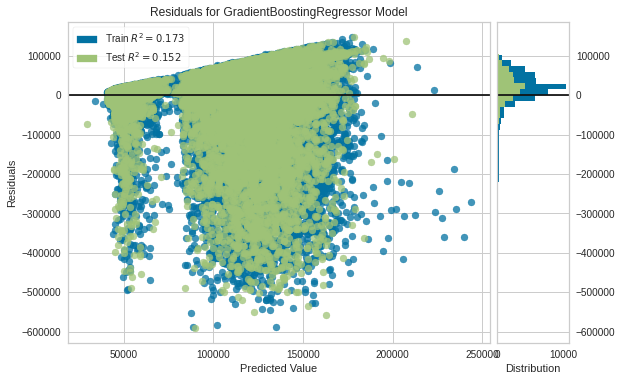

INFO:logs:Visual Rendered Successfully
INFO:logs:plot_model() succesfully completed......................................


In [ ]:
plot_model(gbr)

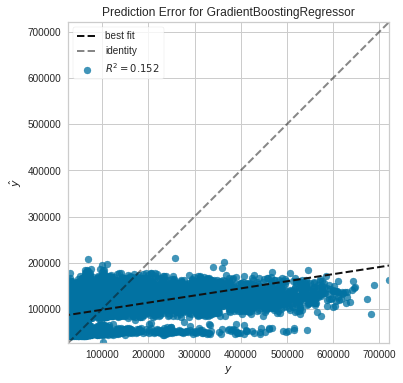

INFO:logs:Visual Rendered Successfully
INFO:logs:plot_model() succesfully completed......................................


In [ ]:
plot_model(gbr, plot = 'error')

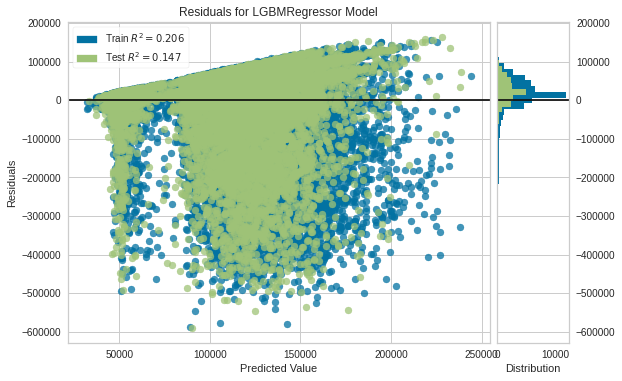

INFO:logs:Visual Rendered Successfully
INFO:logs:plot_model() succesfully completed......................................


In [ ]:
plot_model(lightgbm)

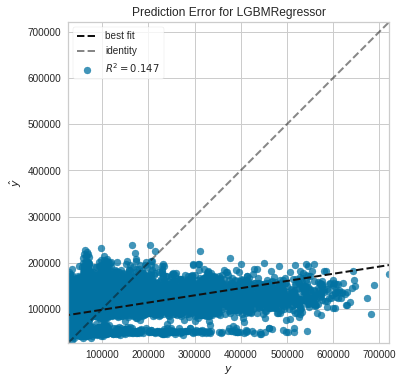

INFO:logs:Visual Rendered Successfully
INFO:logs:plot_model() succesfully completed......................................


In [ ]:
plot_model(lightgbm, plot = 'error')

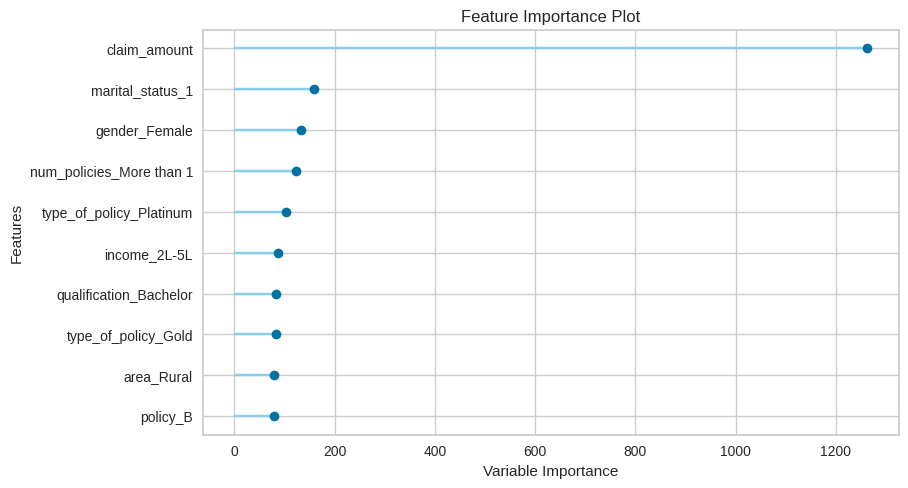

INFO:logs:Visual Rendered Successfully
INFO:logs:plot_model() succesfully completed......................................


In [ ]:
plot_model(lightgbm, plot='feature')

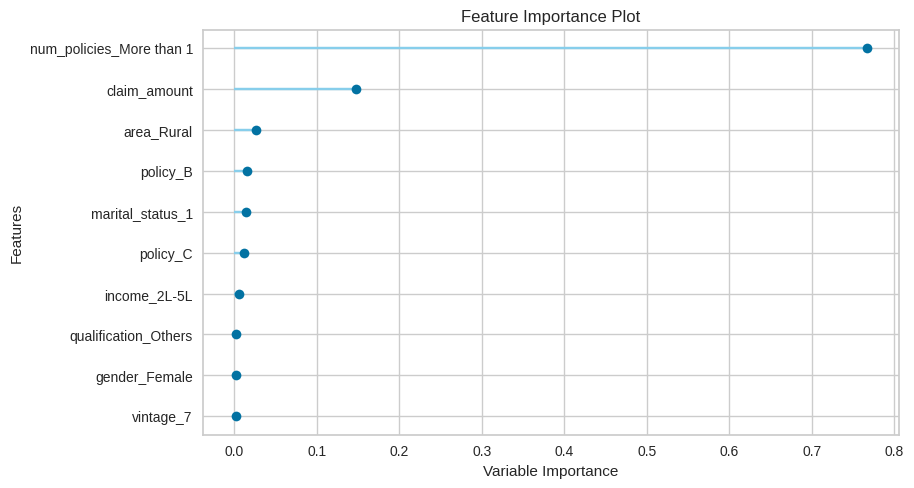

INFO:logs:Visual Rendered Successfully
INFO:logs:plot_model() succesfully completed......................................


In [ ]:
plot_model(gbr, plot='feature')

<h2> Model Prediction

In [ ]:
predict_model(gbr);

INFO:logs:Initializing predict_model()
INFO:logs:predict_model(estimator=GradientBoostingRegressor(alpha=0.9, ccp_alpha=0.0, criterion='friedman_mse',
                          init=None, learning_rate=0.1, loss='ls', max_depth=3,
                          max_features=None, max_leaf_nodes=None,
                          min_impurity_decrease=0.0, min_impurity_split=None,
                          min_samples_leaf=1, min_samples_split=2,
                          min_weight_fraction_leaf=0.0, n_estimators=100,
                          n_iter_no_change=None, presort='deprecated',
                          random_state=123, subsample=1.0, tol=0.0001,
                          validation_fraction=0.1, verbose=0, warm_start=False), probability_threshold=None, encoded_labels=True, drift_report=False, raw_score=False, round=4, verbose=True, ml_usecase=MLUsecase.REGRESSION, display=None, drift_kwargs=None)
INFO:logs:Checking exceptions
INFO:logs:Preloading libraries
INFO:logs:Preparing displ

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Gradient Boosting Regressor,51251.186,7.076729e+09,84123.2943,0.152,0.5714,0.5528


In [ ]:
predict_model(lightgbm);

INFO:logs:Initializing predict_model()
INFO:logs:predict_model(estimator=LGBMRegressor(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
              importance_type='split', learning_rate=0.1, max_depth=-1,
              min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
              n_estimators=100, n_jobs=-1, num_leaves=31, objective=None,
              random_state=123, reg_alpha=0.0, reg_lambda=0.0, silent='warn',
              subsample=1.0, subsample_for_bin=200000, subsample_freq=0), probability_threshold=None, encoded_labels=True, drift_report=False, raw_score=False, round=4, verbose=True, ml_usecase=MLUsecase.REGRESSION, display=None, drift_kwargs=None)
INFO:logs:Checking exceptions
INFO:logs:Preloading libraries
INFO:logs:Preparing display monitor


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Light Gradient Boosting Machine,51310.0293,7.116056e+09,84356.7216,0.1473,0.5726,0.5526


In [ ]:
final_gbr = finalize_model(gbr)
final_lightgbm = finalize_model(lightgbm)

INFO:logs:Initializing finalize_model()
INFO:logs:finalize_model(estimator=GradientBoostingRegressor(alpha=0.9, ccp_alpha=0.0, criterion='friedman_mse',
                          init=None, learning_rate=0.1, loss='ls', max_depth=3,
                          max_features=None, max_leaf_nodes=None,
                          min_impurity_decrease=0.0, min_impurity_split=None,
                          min_samples_leaf=1, min_samples_split=2,
                          min_weight_fraction_leaf=0.0, n_estimators=100,
                          n_iter_no_change=None, presort='deprecated',
                          random_state=123, subsample=1.0, tol=0.0001,
                          validation_fraction=0.1, verbose=0, warm_start=False), fit_kwargs=None, groups=None, model_only=True, display=None, experiment_custom_tags=None, return_train_score=False)
INFO:logs:Finalizing GradientBoostingRegressor(alpha=0.9, ccp_alpha=0.0, criterion='friedman_mse',
                          init=None, learnin

In [ ]:
predict_model(final_lightgbm);

INFO:logs:Initializing predict_model()
INFO:logs:predict_model(estimator=LGBMRegressor(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
              importance_type='split', learning_rate=0.1, max_depth=-1,
              min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
              n_estimators=100, n_jobs=-1, num_leaves=31, objective=None,
              random_state=123, reg_alpha=0.0, reg_lambda=0.0, silent='warn',
              subsample=1.0, subsample_for_bin=200000, subsample_freq=0), probability_threshold=None, encoded_labels=True, drift_report=False, raw_score=False, round=4, verbose=True, ml_usecase=MLUsecase.REGRESSION, display=None, drift_kwargs=None)
INFO:logs:Checking exceptions
INFO:logs:Preloading libraries
INFO:logs:Preparing display monitor


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Light Gradient Boosting Machine,50191.3505,6.787351e+09,82385.3809,0.1866,0.5602,0.5422


In [ ]:
unseen_predictions = predict_model(final_lightgbm, data=data_unseen)
unseen_predictions.head()

INFO:logs:Initializing predict_model()
INFO:logs:predict_model(estimator=LGBMRegressor(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
              importance_type='split', learning_rate=0.1, max_depth=-1,
              min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
              n_estimators=100, n_jobs=-1, num_leaves=31, objective=None,
              random_state=123, reg_alpha=0.0, reg_lambda=0.0, silent='warn',
              subsample=1.0, subsample_for_bin=200000, subsample_freq=0), probability_threshold=None, encoded_labels=True, drift_report=False, raw_score=False, round=4, verbose=True, ml_usecase=MLUsecase.REGRESSION, display=None, drift_kwargs=None)
INFO:logs:Checking exceptions
INFO:logs:Preloading libraries
INFO:logs:Preparing display monitor


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Light Gradient Boosting Machine,50395.6101,6.932817e+09,83263.542,0.1577,0.5679,0.551


,gender,area,qualification,income,marital_status,vintage,claim_amount,num_policies,policy,type_of_policy,cltv,Label
0,Female,Urban,Bachelor,More than 10L,1,2,7541,More than 1,A,Platinum,110568,135812.760411
1,Female,Urban,High School,5L-10L,0,5,8145,More than 1,A,Silver,262260,147877.587948
2,Female,Rural,High School,5L-10L,1,3,0,1,A,Platinum,33552,48826.119969
3,Female,Urban,Bachelor,5L-10L,0,7,2806,More than 1,B,Silver,70236,107180.190252
4,Female,Urban,High School,2L-5L,0,3,5443,1,A,Platinum,52464,52096.569759


In [ ]:
from pycaret.utils import check_metric
check_metric(unseen_predictions.cltv, unseen_predictions.Label, 'R2')

0.1577

<h2> Test Data

In [55]:
data_test = pd.read_csv('/content/drive/MyDrive/customer_cltv/test_koRSKBP.csv')

In [56]:
data_test.head()

,id,gender,area,qualification,income,marital_status,vintage,claim_amount,num_policies,policy,type_of_policy
0,89393,Female,Rural,High School,5L-10L,0,6,2134,More than 1,B,Silver
1,89394,Female,Urban,High School,2L-5L,0,4,4102,More than 1,A,Platinum
2,89395,Male,Rural,High School,5L-10L,1,7,2925,More than 1,B,Gold
3,89396,Female,Rural,Bachelor,More than 10L,1,2,0,More than 1,B,Silver
4,89397,Female,Urban,High School,2L-5L,0,5,14059,More than 1,B,Silver


In [36]:
data_test.drop('id', axis=1, inplace=True)

In [ ]:
test_predictions = predict_model(final_lightgbm, data=data_test)
test_predictions.head()

INFO:logs:Initializing predict_model()
INFO:logs:predict_model(estimator=LGBMRegressor(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
              importance_type='split', learning_rate=0.1, max_depth=-1,
              min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
              n_estimators=100, n_jobs=-1, num_leaves=31, objective=None,
              random_state=123, reg_alpha=0.0, reg_lambda=0.0, silent='warn',
              subsample=1.0, subsample_for_bin=200000, subsample_freq=0), probability_threshold=None, encoded_labels=True, drift_report=False, raw_score=False, round=4, verbose=True, ml_usecase=MLUsecase.REGRESSION, display=None, drift_kwargs=None)
INFO:logs:Checking exceptions
INFO:logs:Preloading libraries
INFO:logs:Preparing display monitor


,gender,area,qualification,income,marital_status,vintage,claim_amount,num_policies,policy,type_of_policy,Label
0,Female,Rural,High School,5L-10L,0,6,2134,More than 1,B,Silver,92735.667123
1,Female,Urban,High School,2L-5L,0,4,4102,More than 1,A,Platinum,134258.206195
2,Male,Rural,High School,5L-10L,1,7,2925,More than 1,B,Gold,97159.174398
3,Female,Rural,Bachelor,More than 10L,1,2,0,More than 1,B,Silver,88917.515009
4,Female,Urban,High School,2L-5L,0,5,14059,More than 1,B,Silver,120864.833580


In [ ]:
data_test['cltv'] = test_predictions['Label']

In [ ]:
sample_submission = data_test[['id','cltv']]

In [ ]:
sample_submission.to_csv("light_gbm_predict.csv",index=False)

In [ ]:
model_2 = setup(data = data, target = 'cltv', session_id=123,
                  normalize = True, transformation = True, transform_target = True, 
                  combine_rare_levels = True, rare_level_threshold = 0.05,
                  remove_multicollinearity = True, multicollinearity_threshold = 0.95, 
                  log_experiment = True, experiment_name = 'diamond1') 

,Description,Value
0,session_id,123
1,Target,cltv
2,Original Data,"(75983, 11)"
3,Missing Values,False
4,Numeric Features,1
5,Categorical Features,9
6,Ordinal Features,False
7,High Cardinality Features,False
8,High Cardinality Method,None
9,Transformed Train Set,"(53188, 27)"


INFO:logs:Logging experiment in MLFlow
2023/01/21 11:26:38 INFO mlflow.tracking.fluent: Experiment with name 'diamond1' does not exist. Creating a new experiment.
INFO:logs:SubProcess save_model() called ==================================
INFO:logs:Initializing save_model()
INFO:logs:save_model(model=Pipeline(memory=None,
         steps=[('dtypes',
                 DataTypes_Auto_infer(categorical_features=[],
                                      display_types=True, features_todrop=[],
                                      id_columns=[], ml_usecase='regression',
                                      numerical_features=[], target='cltv',
                                      time_features=[])),
                ('imputer',
                 Simple_Imputer(categorical_strategy='not_available',
                                fill_value_categorical=None,
                                fill_value_numerical=None,
                                numeric_strategy='m...
                ('dummy

In [ ]:
top3 = compare_models(exclude = ['ransac'], n_select = 3)

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
lightgbm,Light Gradient Boosting Machine,44218.0105,7.517693e+09,86668.5966,0.0775,0.5382,0.3696,0.458
gbr,Gradient Boosting Regressor,44206.9180,7.530947e+09,86744.4507,0.0759,0.5380,0.3690,4.367
ada,AdaBoost Regressor,44680.5163,7.545063e+09,86825.2188,0.0741,0.5404,0.3873,1.613
lr,Linear Regression,44403.6965,7.583921e+09,87048.7593,0.0694,0.5403,0.3707,0.135
lar,Least Angle Regression,44403.1298,7.583938e+09,87048.9085,0.0694,0.5403,0.3707,0.076
ridge,Ridge Regression,44403.0810,7.584047e+09,87049.5284,0.0693,0.5403,0.3707,0.073
br,Bayesian Ridge,44402.7122,7.584659e+09,87053.0466,0.0693,0.5403,0.3706,0.128
omp,Orthogonal Matching Pursuit,44564.2986,7.621782e+09,87265.1186,0.0647,0.5421,0.3719,0.073
rf,Random Forest Regressor,46149.1965,7.633861e+09,87339.9907,0.0630,0.5635,0.4039,23.274
huber,Huber Regressor,44326.5878,7.772149e+09,88122.6830,0.0463,0.5473,0.3542,0.782


INFO:logs:create_model_container: 17
INFO:logs:master_model_container: 17
INFO:logs:display_container: 2
INFO:logs:[PowerTransformedTargetRegressor(boosting_type='gbdt', class_weight=None,
                                colsample_bytree=1.0, importance_type='split',
                                learning_rate=0.1, max_depth=-1,
                                min_child_samples=20, min_child_weight=0.001,
                                min_split_gain=0.0, n_estimators=100, n_jobs=-1,
                                num_leaves=31, objective=None,
                                power_transformer_method='box-cox',
                                power_transformer_standardize=True,
                                random_state=1...
                                                        importance_type='split',
                                                        learning_rate=0.1,
                                                        max_depth=-1,
                                 

In [ ]:
dt = create_model('dt')

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,65469.7272,1.356210e+10,116456.4334,-0.7557,0.7478,0.7106
1,66891.9187,1.388748e+10,117845.1465,-0.6554,0.7592,0.7215
2,67375.1116,1.407107e+10,118621.5506,-0.7049,0.7668,0.7260
3,66260.3485,1.346793e+10,116051.4272,-0.7460,0.7528,0.7280
4,66050.9767,1.367861e+10,116955.5953,-0.5766,0.7519,0.6895
5,67354.4722,1.371278e+10,117101.5606,-0.6465,0.7605,0.7092
6,66685.8324,1.354330e+10,116375.6648,-0.7146,0.7588,0.7129
7,66577.3065,1.370899e+10,117085.3902,-0.7245,0.7505,0.7128
8,66360.6224,1.369109e+10,117008.9378,-0.8005,0.7547,0.7200


INFO:logs:create_model_container: 18
INFO:logs:master_model_container: 18
INFO:logs:display_container: 3
INFO:logs:PowerTransformedTargetRegressor(ccp_alpha=0.0, criterion='mse', max_depth=None,
                                max_features=None, max_leaf_nodes=None,
                                min_impurity_decrease=0.0,
                                min_impurity_split=None, min_samples_leaf=1,
                                min_samples_split=2,
                                min_weight_fraction_leaf=0.0,
                                power_transformer_method='box-cox',
                                power_transformer_standardize=True,
                                presort='deprecated', random_state=123,
                                regressor=DecisionTreeRegressor(ccp_alpha=0.0,
                                                                criterion='mse',
                                                                max_depth=None,
                                  

In [ ]:
bagged_dt = ensemble_model(dt)

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,46057.1252,7.365060e+09,85819.9295,0.0466,0.5698,0.4173
1,47690.0522,7.986272e+09,89365.9427,0.0480,0.5818,0.4259
2,48096.3286,7.973906e+09,89296.7306,0.0338,0.5839,0.4260
3,46102.5418,7.309615e+09,85496.2887,0.0524,0.5736,0.4236
4,48623.9737,8.299799e+09,91103.2328,0.0434,0.5897,0.4247
5,48459.3543,7.930355e+09,89052.5412,0.0478,0.5866,0.4265
6,47826.1661,7.649130e+09,87459.3051,0.0316,0.5858,0.4338
7,46787.8890,7.590786e+09,87125.1141,0.0451,0.5732,0.4184
8,45878.3027,7.391785e+09,85975.4913,0.0279,0.5708,0.4212


INFO:logs:create_model_container: 19
INFO:logs:master_model_container: 19
INFO:logs:display_container: 4
INFO:logs:PowerTransformedTargetRegressor(base_estimator=DecisionTreeRegressor(ccp_alpha=0.0,
                                                                     criterion='mse',
                                                                     max_depth=None,
                                                                     max_features=None,
                                                                     max_leaf_nodes=None,
                                                                     min_impurity_decrease=0.0,
                                                                     min_impurity_split=None,
                                                                     min_samples_leaf=1,
                                                                     min_samples_split=2,
                                                                     min_weight_fra

In [ ]:
boosted_dt = ensemble_model(dt, method = 'Boosting')

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,49937.6316,8.439008e+09,91864.0718,-0.0925,0.6230,0.4719
1,52094.2259,9.069290e+09,95232.8218,-0.0811,0.6345,0.4815
2,51727.3046,9.023974e+09,94994.5988,-0.0934,0.6348,0.4759
3,50061.5594,8.349575e+09,91376.0069,-0.0825,0.6195,0.4784
4,52517.9082,9.463178e+09,97278.8689,-0.0907,0.6383,0.4787
5,52685.2010,9.036398e+09,95059.9687,-0.0850,0.6371,0.4833
6,51647.3776,8.877493e+09,94220.4512,-0.1239,0.6356,0.4883
7,49694.9693,8.346142e+09,91357.2227,-0.0499,0.6143,0.4595
8,50468.9508,8.623504e+09,92862.8210,-0.1340,0.6238,0.4807


INFO:logs:create_model_container: 20
INFO:logs:master_model_container: 20
INFO:logs:display_container: 5
INFO:logs:PowerTransformedTargetRegressor(base_estimator=DecisionTreeRegressor(ccp_alpha=0.0,
                                                                     criterion='mse',
                                                                     max_depth=None,
                                                                     max_features=None,
                                                                     max_leaf_nodes=None,
                                                                     min_impurity_decrease=0.0,
                                                                     min_impurity_split=None,
                                                                     min_samples_leaf=1,
                                                                     min_samples_split=2,
                                                                     min_weight_fra

In [ ]:
bagged_dt2 = ensemble_model(dt, n_estimators=100)

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,44692.1802,7.189093e+09,84788.5180,0.0693,0.5518,0.3947
1,46572.7967,7.851816e+09,88610.4738,0.0640,0.5662,0.4058
2,46716.2722,7.784157e+09,88227.8705,0.0568,0.5672,0.4053
3,44706.2953,7.124216e+09,84405.0706,0.0764,0.5548,0.4024
4,47391.1068,8.141008e+09,90227.5342,0.0617,0.5731,0.4057
5,47166.8170,7.772054e+09,88159.2543,0.0668,0.5688,0.4060
6,46491.1427,7.468322e+09,86419.4519,0.0545,0.5676,0.4125
7,45231.6687,7.404437e+09,86049.0401,0.0686,0.5549,0.3952
8,44448.8064,7.192664e+09,84809.5751,0.0541,0.5537,0.3989


INFO:logs:create_model_container: 21
INFO:logs:master_model_container: 21
INFO:logs:display_container: 6
INFO:logs:PowerTransformedTargetRegressor(base_estimator=DecisionTreeRegressor(ccp_alpha=0.0,
                                                                     criterion='mse',
                                                                     max_depth=None,
                                                                     max_features=None,
                                                                     max_leaf_nodes=None,
                                                                     min_impurity_decrease=0.0,
                                                                     min_impurity_split=None,
                                                                     min_samples_leaf=1,
                                                                     min_samples_split=2,
                                                                     min_weight_fra

In [ ]:
lightgbm = create_model('lightgbm', verbose = False)
dt = create_model('dt', verbose = False)
lr = create_model('lr', verbose = False)

INFO:logs:Initializing create_model()
INFO:logs:create_model(estimator=lightgbm, fold=None, round=4, cross_validation=True, predict=True, fit_kwargs=None, groups=None, refit=True, verbose=False, system=True, metrics=None, experiment_custom_tags=None, add_to_model_list=True, probability_threshold=None, display=None, return_train_score=False, kwargs={})
INFO:logs:Checking exceptions
INFO:logs:Importing libraries
INFO:logs:Copying training dataset
INFO:logs:Defining folds
INFO:logs:Declaring metric variables
INFO:logs:Importing untrained model
INFO:logs:Light Gradient Boosting Machine Imported succesfully
INFO:logs:Starting cross validation
INFO:logs:Cross validating with KFold(n_splits=10, random_state=None, shuffle=False), n_jobs=-1
INFO:logs:Calculating mean and std
INFO:logs:Creating metrics dataframe
INFO:logs:Finalizing model
INFO:logs:Creating Dashboard logs
INFO:logs:Model: Light Gradient Boosting Machine
INFO:logs:logged params: {'boosting_type': 'gbdt', 'class_weight': None, 'co

In [ ]:
blender = blend_models(estimator_list = [lightgbm, dt, lr])

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,44610.6520,7.195887e+09,84828.5756,0.0685,0.5488,0.3904
1,46405.6494,7.851956e+09,88611.2625,0.0640,0.5631,0.4002
2,46544.0222,7.832918e+09,88503.7720,0.0509,0.5683,0.3992
3,44607.5518,7.117435e+09,84364.8902,0.0773,0.5521,0.3989
4,46967.2114,8.132768e+09,90181.8584,0.0626,0.5688,0.3969
5,46984.2908,7.808425e+09,88365.2905,0.0624,0.5672,0.3988
6,46126.2662,7.458529e+09,86362.7760,0.0557,0.5631,0.4022
7,45255.2641,7.403923e+09,86046.0523,0.0686,0.5535,0.3936
8,44141.1832,7.116492e+09,84359.3032,0.0641,0.5484,0.3911


INFO:logs:create_model_container: 25
INFO:logs:master_model_container: 25
INFO:logs:display_container: 10
INFO:logs:PowerTransformedTargetRegressor(estimators=[('lightgbm',
                                             LGBMRegressor(boosting_type='gbdt',
                                                           class_weight=None,
                                                           colsample_bytree=1.0,
                                                           importance_type='split',
                                                           learning_rate=0.1,
                                                           max_depth=-1,
                                                           min_child_samples=20,
                                                           min_child_weight=0.001,
                                                           min_split_gain=0.0,
                                                           n_estimators=100,
                                

In [ ]:
blender_top3 = blend_models(top3)

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,42954.8361,7.102590e+09,84276.8648,0.0805,0.5266,0.3669
1,44781.3973,7.754669e+09,88060.5964,0.0756,0.5400,0.3758
2,44798.3950,7.714430e+09,87831.8291,0.0653,0.5426,0.3742
3,42874.6637,7.034081e+09,83869.4258,0.0881,0.5291,0.3723
4,45843.6783,8.070675e+09,89836.9382,0.0698,0.5502,0.3797
5,45513.6987,7.721682e+09,87873.1007,0.0729,0.5447,0.3780
6,44437.2051,7.301782e+09,85450.4680,0.0756,0.5388,0.3801
7,43666.8101,7.288977e+09,85375.5032,0.0831,0.5302,0.3698
8,42231.1031,6.952242e+09,83380.1061,0.0857,0.5219,0.3654


INFO:logs:create_model_container: 26
INFO:logs:master_model_container: 26
INFO:logs:display_container: 11
INFO:logs:PowerTransformedTargetRegressor(estimators=[('lightgbm',
                                             LGBMRegressor(boosting_type='gbdt',
                                                           class_weight=None,
                                                           colsample_bytree=1.0,
                                                           importance_type='split',
                                                           learning_rate=0.1,
                                                           max_depth=-1,
                                                           min_child_samples=20,
                                                           min_child_weight=0.001,
                                                           min_split_gain=0.0,
                                                           n_estimators=100,
                                

In [ ]:
stacker = stack_models(top3)

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,42820.5099,7.103899e+09,84284.6338,0.0804,0.5271,0.3621
1,44657.4124,7.751398e+09,88042.0218,0.0760,0.5401,0.3709
2,44698.4349,7.708988e+09,87800.8451,0.0659,0.5432,0.3688
3,42752.4591,7.026740e+09,83825.6521,0.0890,0.5290,0.3675
4,45715.0558,8.070587e+09,89836.4461,0.0698,0.5504,0.3744
5,45404.7618,7.712103e+09,87818.5814,0.0740,0.5447,0.3726
6,44363.1803,7.301679e+09,85449.8636,0.0756,0.5392,0.3759
7,43563.3938,7.289689e+09,85379.6742,0.0830,0.5304,0.3649
8,42151.9886,6.951764e+09,83377.2381,0.0858,0.5224,0.3613


INFO:logs:create_model_container: 27
INFO:logs:master_model_container: 27
INFO:logs:display_container: 12
INFO:logs:PowerTransformedTargetRegressor(cv=5,
                                estimators=[('lightgbm',
                                             LGBMRegressor(boosting_type='gbdt',
                                                           class_weight=None,
                                                           colsample_bytree=1.0,
                                                           importance_type='split',
                                                           learning_rate=0.1,
                                                           max_depth=-1,
                                                           min_child_samples=20,
                                                           min_child_weight=0.001,
                                                           min_split_gain=0.0,
                                                           n_estimators

<h2> H2O AutoML

In [59]:
!pip uninstall scikit-learn
!pip install h2o
import h2o
from h2o.automl import H2OAutoML

Found existing installation: scikit-learn 1.1.3
Uninstalling scikit-learn-1.1.3:
  Would remove:
    /usr/local/lib/python3.8/dist-packages/scikit_learn-1.1.3.dist-info/*
    /usr/local/lib/python3.8/dist-packages/scikit_learn.libs/libgomp-a34b3233.so.1.0.0
    /usr/local/lib/python3.8/dist-packages/sklearn/*
Proceed (Y/n)? y
  Successfully uninstalled scikit-learn-1.1.3
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [60]:
h2o.init(nthreads=-1)

Checking whether there is an H2O instance running at http://localhost:54321 ..... not found.
Attempting to start a local H2O server...
  Java Version: openjdk version "11.0.17" 2022-10-18; OpenJDK Runtime Environment (build 11.0.17+8-post-Ubuntu-1ubuntu220.04); OpenJDK 64-Bit Server VM (build 11.0.17+8-post-Ubuntu-1ubuntu220.04, mixed mode, sharing)
  Starting server from /usr/local/lib/python3.8/dist-packages/h2o/backend/bin/h2o.jar
  Ice root: /tmp/tmpeaplbpcv
  JVM stdout: /tmp/tmpeaplbpcv/h2o_unknownUser_started_from_python.out
  JVM stderr: /tmp/tmpeaplbpcv/h2o_unknownUser_started_from_python.err
  Server is running at http://127.0.0.1:54321
Connecting to H2O server at http://127.0.0.1:54321 ... successful.


H2O_cluster_uptime:,04 secs
H2O_cluster_timezone:,Etc/UTC
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.38.0.4
H2O_cluster_version_age:,16 days
H2O_cluster_name:,H2O_from_python_unknownUser_8d0a7x
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,3.172 Gb
H2O_cluster_total_cores:,2
H2O_cluster_allowed_cores:,2
H2O_cluster_status:,"locked, healthy"


In [61]:
train = h2o.import_file("/content/drive/MyDrive/customer_cltv/train_BRCpofr.csv")
test = h2o.import_file("/content/drive/MyDrive/customer_cltv/test_koRSKBP.csv")

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


In [62]:
train_as_df = h2o.as_list(train, use_pandas=True)

In [63]:
train_as_df.drop('id', axis=1, inplace=True)

In [64]:
train = h2o.H2OFrame(train_as_df)

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


In [65]:
x = train.columns
y = "cltv"
x.remove(y)

In [66]:
aml = H2OAutoML(max_models=60, seed=1, stopping_metric='rmse', )
aml.train(x=x, y=y, training_frame=train)

AutoML progress: |███████████████████████████████████████████████████████████████| (done) 100%


,mean,sd,cv_1_valid,cv_2_valid,cv_3_valid,cv_4_valid,cv_5_valid
mae,50421.824,274.2747,50491.016,50519.113,50581.69,50581.023,49936.28
mean_residual_deviance,6891210800.0000000,156270528.0000000,6919521300.0000000,6834143200.0000000,6995765200.0000000,7053086200.0000000,6653537800.0000000
mse,6891210800.0000000,156270528.0000000,6919521300.0000000,6834143200.0000000,6995765200.0000000,7053086200.0000000,6653537800.0000000
null_deviance,146800338000000.0000000,3256897500000.0000000,148089617000000.0000000,145370684000000.0000000,150285268000000.0000000,148367313000000.0000000,141888791000000.0000000
r2,0.1606792,0.0029008,0.1634684,0.1567683,0.1611391,0.1587571,0.1632634
residual_deviance,123202202000000.0000000,2824731360000.0000000,123873266000000.0000000,122577201000000.0000000,126056695000000.0000000,124811414000000.0000000,118692461000000.0000000
rmse,83009.02,944.2179,83183.66,82668.875,83640.695,83982.66,81569.22
rmsle,0.5657893,0.0013618,0.5650104,0.5675277,0.5650762,0.5669408,0.5643912


In [67]:
lb = aml.leaderboard
lb.head(rows=lb.nrows)

model_id,rmse,mse,mae,rmsle,mean_residual_deviance
StackedEnsemble_AllModels_1_AutoML_1_20230122_163250,83012.8,6.89112e+09,50422,0.565789,6.89112e+09
StackedEnsemble_BestOfFamily_1_AutoML_1_20230122_163250,83019.5,6.89224e+09,50431,0.56582,6.89224e+09
GBM_grid_1_AutoML_1_20230122_163250_model_2,83031,6.89416e+09,50438.8,0.565501,6.89416e+09
XGBoost_grid_1_AutoML_1_20230122_163250_model_16,83050.1,6.89731e+09,50507.5,0.566045,6.89731e+09
GBM_grid_1_AutoML_1_20230122_163250_model_9,83062.7,6.89941e+09,50434.7,0.566915,6.89941e+09
GBM_5_AutoML_1_20230122_163250,83065.3,6.89984e+09,50399.9,0.566621,6.89984e+09
GBM_grid_1_AutoML_1_20230122_163250_model_3,83072.4,6.90102e+09,50509.8,0.567194,6.90102e+09
GBM_grid_1_AutoML_1_20230122_163250_model_7,83093.1,6.90446e+09,50486.5,0.56916,6.90446e+09
GBM_grid_1_AutoML_1_20230122_163250_model_12,83098.2,6.90532e+09,50466.5,0.566263,6.90532e+09
GBM_grid_1_AutoML_1_20230122_163250_model_6,83104.6,6.90637e+09,50383.7,0.568223,6.90637e+09


In [68]:
preds = aml.leader.predict(test)

stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


In [69]:
df = test.cbind(preds)
df.head(2)

id,gender,area,qualification,income,marital_status,vintage,claim_amount,num_policies,policy,type_of_policy,predict
89393,Female,Rural,High School,5L-10L,0,6,2134,More than 1,B,Silver,94111
89394,Female,Urban,High School,2L-5L,0,4,4102,More than 1,A,Platinum,131021


In [70]:
res = df[:, ["id", "predict"]].rename({'predict': 'cltv'})
res.head(2)

id,cltv
89393,94111
89394,131021


In [71]:
h2o.export_file(res, path = "/content/drive/MyDrive/customer_cltv/h2o_deep_learning_pred.csv", force = True)

Export File progress: |██████████████████████████████████████████████████████████| (done) 100%


<h2> Auto Sklearn

In [154]:
!pip uninstall scikit-learn
!pip install tpot
import tpot

Found existing installation: scikit-learn 0.24.2
Uninstalling scikit-learn-0.24.2:
  Would remove:
    /usr/local/lib/python3.8/dist-packages/scikit_learn-0.24.2.dist-info/*
    /usr/local/lib/python3.8/dist-packages/scikit_learn.libs/libgomp-f7e03b3e.so.1.0.0
    /usr/local/lib/python3.8/dist-packages/sklearn/*
Proceed (Y/n)? y
  Successfully uninstalled scikit-learn-0.24.2
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.7/9.7 MB 66.1 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
auto-sklearn 0.15.0 requires scikit-learn<0.25.0,>=0.24.0, but you have scikit-learn 1.2.0 which is incompatible.


In [155]:
from tpot import TPOTRegressor

In [156]:
tpot = TPOTRegressor(verbosity=3,  
                    random_state=55, 
                    scoring='r2',
                    periodic_checkpoint_folder="intermediate_results",
                    n_jobs=-1, 
                    warm_start = True,
                    generations=100, 
                    population_size=80,
                    early_stop=8, )

In [157]:
tpot.fit(X_train, y_train)

30 operators have been imported by TPOT.


Optimization Progress:   0%|          | 0/8080 [00:00<?, ?pipeline/s]

_pre_test decorator: _random_mutation_operator: num_test=0 Found array with 0 feature(s) (shape=(50, 0)) while a minimum of 1 is required..
_pre_test decorator: _random_mutation_operator: num_test=0 Found array with 0 feature(s) (shape=(50, 0)) while a minimum of 1 is required..
_pre_test decorator: _random_mutation_operator: num_test=1 Unsupported set of arguments: The combination of penalty='l2' and loss='epsilon_insensitive' are not supported when dual=False, Parameters: penalty='l2', loss='epsilon_insensitive', dual=False.
_pre_test decorator: _random_mutation_operator: num_test=2 feature_names must be string, and may not contain [, ] or <.
_pre_test decorator: _random_mutation_operator: num_test=0 Unsupported set of arguments: The combination of penalty='l2' and loss='epsilon_insensitive' are not supported when dual=False, Parameters: penalty='l2', loss='epsilon_insensitive', dual=False.

Generation 1 - Current Pareto front scores:

-1	0.15099113584882334	ExtraTreesRegressor(input

TPOTRegressor(early_stop=8, n_jobs=-1,
              periodic_checkpoint_folder='intermediate_results',
              population_size=80, random_state=55, scoring='r2', verbosity=3,
              warm_start=True)

In [159]:
tpot.export('tpot_data.py')

In [160]:
tpot.score(X_test, y_test)

0.16195348187723624

In [161]:
tpot.predict(test_data)

array([ 94874.44676808, 134311.71777236,  90049.70616442, ...,
       104516.44135369, 105879.99020101, 111349.79749493])

In [162]:
test_data

,Male,Urban,High School,Others,income,Single,<=6,>6,new,<=4089,<=6094,>6094,More than 1,B,C,type_of_policy
0,0,0,1,0,3,1,1,0,0,0,0,0,1,1,0,1
1,0,1,1,0,2,1,1,0,0,0,1,0,1,0,0,3
2,1,0,1,0,3,0,0,1,0,1,0,0,1,1,0,2
3,0,0,0,0,4,0,0,0,0,0,0,0,1,1,0,1
4,0,1,1,0,2,1,1,0,0,0,0,1,1,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59590,1,0,0,0,3,0,1,0,0,0,0,0,0,0,0,1
59591,1,1,1,0,3,1,1,0,0,0,0,0,0,0,1,2
59592,0,1,1,0,2,0,1,0,0,1,0,0,1,1,0,3
59593,1,0,0,0,3,1,0,0,0,1,0,0,1,0,0,1


In [165]:
data_test['cltv'] = tpot.predict(test_data)

In [168]:
data_test[['id', 'cltv']].to_csv('tpot_prediction.csv', index=False)

<h2>Eval ML

In [172]:
!pip uninstall scikit-learn
!pip install evalml

Found existing installation: scikit-learn 1.1.3
Uninstalling scikit-learn-1.1.3:
  Would remove:
    /usr/local/lib/python3.8/dist-packages/scikit_learn-1.1.3.dist-info/*
    /usr/local/lib/python3.8/dist-packages/scikit_learn.libs/libgomp-a34b3233.so.1.0.0
    /usr/local/lib/python3.8/dist-packages/sklearn/*
Proceed (Y/n)? y
  Successfully uninstalled scikit-learn-1.1.3
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Using cached scikit_learn-1.1.3-cp38-cp38-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (31.2 MB)
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
auto-sklearn 0.15.0 requires scikit-learn<0.25.0,>=0.24.0, but you have scikit-learn 1.1.3 which is incompatible.


In [1]:
from evalml import AutoMLSearch

pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
pandas.Float64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.


In [46]:
automl = AutoMLSearch(X_train = X_train, y_train=y_train, problem_type = "regression", optimize_thresholds=True, objective='R2', )
automl.search()

{1: {'Elastic Net Regressor w/ Replace Nullable Types Transformer + Imputer + Standard Scaler': '00:03',
  'Random Forest Regressor w/ Replace Nullable Types Transformer + Imputer': '00:09',
  'Total time of batch': '00:12'},
 2: {'Elastic Net Regressor w/ Replace Nullable Types Transformer + Imputer + Standard Scaler + RF Regressor Select From Model': '00:04',
  'Random Forest Regressor w/ Replace Nullable Types Transformer + Imputer + RF Regressor Select From Model': '00:08',
  'Total time of batch': '00:12'},
 3: {'Decision Tree Regressor w/ Replace Nullable Types Transformer + Imputer + Select Columns Transformer': '00:01',
  'Extra Trees Regressor w/ Replace Nullable Types Transformer + Imputer + Select Columns Transformer': '00:09',
  'XGBoost Regressor w/ Replace Nullable Types Transformer + Imputer + Select Columns Transformer': '00:11',
  'CatBoost Regressor w/ Replace Nullable Types Transformer + Imputer + Select Columns Transformer': '00:01',
  'LightGBM Regressor w/ Replace

In [47]:
best_pipeline = automl.best_pipeline
best_pipeline

pipeline = RegressionPipeline(component_graph={'Replace Nullable Types Transformer': ['Replace Nullable Types Transformer', 'X', 'y'], 'Imputer': ['Imputer', 'Replace Nullable Types Transformer.x', 'Replace Nullable Types Transformer.y'], 'Random Forest Regressor': ['Random Forest Regressor', 'Imputer.x', 'Replace Nullable Types Transformer.y']}, parameters={'Imputer':{'categorical_impute_strategy': 'most_frequent', 'numeric_impute_strategy': 'mean', 'boolean_impute_strategy': 'most_frequent', 'categorical_fill_value': None, 'numeric_fill_value': None, 'boolean_fill_value': None}, 'Random Forest Regressor':{'n_estimators': 100, 'max_depth': 6, 'n_jobs': -1}}, random_seed=0)

In [48]:
automl.describe_pipeline(automl.rankings.iloc[0]["id"])


***************************************************************************


INFO:evalml.pipelines.pipeline_base.describe:
***************************************************************************


* Random Forest Regressor w/ Replace Nullable Types Transformer + Imputer *


INFO:evalml.pipelines.pipeline_base.describe:* Random Forest Regressor w/ Replace Nullable Types Transformer + Imputer *


***************************************************************************


INFO:evalml.pipelines.pipeline_base.describe:***************************************************************************


INFO:evalml.pipelines.pipeline_base.describe:


Problem Type: regression


INFO:evalml.pipelines.pipeline_base.describe:Problem Type: regression


Model Family: Random Forest


INFO:evalml.pipelines.pipeline_base.describe:Model Family: Random Forest


INFO:evalml.pipelines.pipeline_base.describe:


Pipeline Steps


INFO:evalml.pipelines.pipeline_base.describe:Pipeline Steps


INFO:evalml.pipelines.pipeline_base.describe:==============


1. Replace Nullable Types Transformer


INFO:evalml.pipelines.component_graph.describe:1. Replace Nullable Types Transformer


2. Imputer


INFO:evalml.pipelines.component_graph.describe:2. Imputer


	 * categorical_impute_strategy : most_frequent


INFO:evalml.pipelines.components.component_base.describe:	 * categorical_impute_strategy : most_frequent


	 * numeric_impute_strategy : mean


INFO:evalml.pipelines.components.component_base.describe:	 * numeric_impute_strategy : mean


	 * boolean_impute_strategy : most_frequent


INFO:evalml.pipelines.components.component_base.describe:	 * boolean_impute_strategy : most_frequent


	 * categorical_fill_value : None


INFO:evalml.pipelines.components.component_base.describe:	 * categorical_fill_value : None


	 * numeric_fill_value : None


INFO:evalml.pipelines.components.component_base.describe:	 * numeric_fill_value : None


	 * boolean_fill_value : None


INFO:evalml.pipelines.components.component_base.describe:	 * boolean_fill_value : None


3. Random Forest Regressor


INFO:evalml.pipelines.component_graph.describe:3. Random Forest Regressor


	 * n_estimators : 100


INFO:evalml.pipelines.components.component_base.describe:	 * n_estimators : 100


	 * max_depth : 6


INFO:evalml.pipelines.components.component_base.describe:	 * max_depth : 6


	 * n_jobs : -1


INFO:evalml.pipelines.components.component_base.describe:	 * n_jobs : -1


INFO:evalml.automl.automl_search.describe_pipeline:


Training


INFO:evalml.automl.automl_search.describe_pipeline:Training


INFO:evalml.automl.automl_search.describe_pipeline:========


Training for regression problems.


INFO:evalml.automl.automl_search.describe_pipeline:Training for regression problems.


Total training time (including CV): 9.3 seconds


INFO:evalml.automl.automl_search.describe_pipeline:Total training time (including CV): 9.3 seconds


INFO:evalml.automl.automl_search.describe_pipeline:


Cross Validation


INFO:evalml.automl.automl_search.describe_pipeline:Cross Validation


----------------


INFO:evalml.automl.automl_search.describe_pipeline:----------------


               R2  ExpVariance   MaxError  MedianAE            MSE       MAE  Root Mean Squared Error # Training # Validation
0           0.158        0.158 578539.463 31138.087 6655697181.360 50129.155                81582.456     50,655       25,328
1           0.157        0.157 553979.853 30119.262 7144469312.312 51036.154                84524.963     50,655       25,328
2           0.154        0.154 592441.956 30568.152 7048718688.773 50938.178                83956.648     50,656       25,327
mean        0.156        0.157 574987.091 30608.500 6949628394.149 50701.162                83354.689          -            -
std         0.002        0.002  19475.571   510.610  259014891.204   497.789                 1560.882          -            -
coef of var 0.013        0.014      0.034     0.017          0.037     0.010                    0.019          -            -


INFO:evalml.automl.automl_search.describe_pipeline:               R2  ExpVariance   MaxError  MedianAE            MSE       MAE  Root Mean Squared Error # Training # Validation
0           0.158        0.158 578539.463 31138.087 6655697181.360 50129.155                81582.456     50,655       25,328
1           0.157        0.157 553979.853 30119.262 7144469312.312 51036.154                84524.963     50,655       25,328
2           0.154        0.154 592441.956 30568.152 7048718688.773 50938.178                83956.648     50,656       25,327
mean        0.156        0.157 574987.091 30608.500 6949628394.149 50701.162                83354.689          -            -
std         0.002        0.002  19475.571   510.610  259014891.204   497.789                 1560.882          -            -
coef of var 0.013        0.014      0.034     0.017          0.037     0.010                    0.019          -            -


In [49]:
automl.rankings

,id,pipeline_name,search_order,ranking_score,mean_cv_score,standard_deviation_cv_score,percent_better_than_baseline,high_variance_cv,parameters
0,2,Random Forest Regressor w/ Replace Nullable Ty...,2,0.156383,0.156383,0.002074,126227.432448,False,{'Imputer': {'categorical_impute_strategy': 'm...
1,1,Elastic Net Regressor w/ Replace Nullable Type...,1,0.150663,0.150663,0.002827,121613.965803,False,{'Imputer': {'categorical_impute_strategy': 'm...
2,6,Extra Trees Regressor w/ Replace Nullable Type...,6,0.144316,0.144316,0.002459,116494.594957,False,{'Imputer': {'categorical_impute_strategy': 'm...
3,5,Decision Tree Regressor w/ Replace Nullable Ty...,5,0.143597,0.143597,0.002707,115914.755302,False,{'Imputer': {'categorical_impute_strategy': 'm...
4,9,LightGBM Regressor w/ Replace Nullable Types T...,9,0.142283,0.142283,0.001630,114855.478878,False,{'Imputer': {'categorical_impute_strategy': 'm...
5,4,Random Forest Regressor w/ Replace Nullable Ty...,4,0.141399,0.141399,0.006589,114142.049222,False,{'Imputer': {'categorical_impute_strategy': 'm...
6,7,XGBoost Regressor w/ Replace Nullable Types Tr...,7,0.141239,0.141239,0.002551,114013.178138,False,{'Imputer': {'categorical_impute_strategy': 'm...
7,3,Elastic Net Regressor w/ Replace Nullable Type...,3,0.138961,0.138961,0.005842,112176.047389,False,{'Imputer': {'categorical_impute_strategy': 'm...
8,8,CatBoost Regressor w/ Replace Nullable Types T...,8,0.065330,0.065330,0.001410,52790.152510,False,{'Imputer': {'categorical_impute_strategy': 'm...
9,0,Mean Baseline Regression Pipeline,0,-0.000124,-0.000124,0.000112,0.000000,False,{'Baseline Regressor': {'strategy': 'mean'}}


In [51]:
y_pred = best_pipeline.predict(X_test)

In [52]:
r2_score(y_test, y_pred)

0.15944804048063832

In [57]:
data_test['cltv'] = best_pipeline.predict(test_data)

In [58]:
data_test[['id', 'cltv']].to_csv('evalml_prediction.csv', index=False)